In [5]:
import pandas as pd

# Load the dataset
file_path = '/content/ITC-EQ-01-04-2000-to-31-03-2024.csv'
data = pd.read_csv(file_path)

# Display the first few rows of the dataset
print(data.head())

# Summary statistics
print(data.describe())

# Check for missing values
print(data.isnull().sum())

         date series   open   high     low  prev._close     ltp   close  \
0  2000-04-03     EQ  739.9  800.8  721.05       741.45  792.75  797.00   
1  2000-04-04     EQ  785.0  785.0  733.25       797.00  733.25  733.25   
2  2000-04-05     EQ  680.0  740.0  675.05       733.25  696.10  698.75   
3  2000-04-06     EQ  705.0  711.0  646.10       698.75  685.00  682.80   
4  2000-04-07     EQ  682.0  733.9  682.00       682.80  730.00  730.95   

     vwap   52w_h  52w_l   volume         value  no_of_trades  
0  772.76  1140.8  580.0  1720025  1.329165e+09           NaN  
1  744.37  1140.8  580.0   581309  4.327067e+08           NaN  
2  700.53  1140.8  580.0   706269  4.947637e+08           NaN  
3  676.06  1140.8  580.0   431386  2.916423e+08           NaN  
4  722.23  1140.8  580.0  1087357  7.853181e+08           NaN  
              open         high          low  prev._close          ltp  \
count  5981.000000  5981.000000  5981.000000  5981.000000  5981.000000   
mean    405.04126

In [6]:
# Handle missing values by filling with forward fill method
data['52w_h'].ffill(inplace=True)
data['52w_l'].ffill(inplace=True)
data['no_of_trades'].fillna(0, inplace=True)

# Convert the 'date' column to datetime format
data['date'] = pd.to_datetime(data['date'])

# Sort the dataset by date
data.sort_values('date', inplace=True)

# Reset the index
data.reset_index(drop=True, inplace=True)

# Drop any remaining rows with NaN values
data.dropna(inplace=True)

In [33]:
# 1. Moving Averages
# Calculate moving averages for different windows (e.g., 20-day and 50-day)
data['MA_20'] = data['close'].rolling(window=20).mean()
data['MA_50'] = data['close'].rolling(window=50).mean()

# 2. Volatility Measures
# Calculate daily return (percentage change)
data['Daily_Return'] = data['close'].pct_change()

# Calculate rolling standard deviation as a measure of volatility
data['Volatility_20'] = data['Daily_Return'].rolling(window=20).std()  # 20-day rolling volatility
data['Volatility_50'] = data['Daily_Return'].rolling(window=50).std()  # 50-day rolling volatility

# 3. Lagged Variables
# Create lagged features (previous day's close price)
data['Lag_1'] = data['close'].shift(1)
data['Lag_2'] = data['close'].shift(2)
data['Lag_3'] = data['close'].shift(3)

# 4. Price Range
# Calculate the daily price range (high - low)
data['Price_Range'] = data['high'] - data['low']

# 5. Relative Strength Index (RSI)
# Calculate RSI as a momentum indicator
delta = data['close'].diff()
gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
rs = gain / loss
data['RSI'] = 100 - (100 / (1 + rs))

# 6. Exponential Moving Average (EMA)
# Calculate the exponential moving average for different periods
data['EMA_12'] = data['close'].ewm(span=12, adjust=False).mean()
data['EMA_26'] = data['close'].ewm(span=26, adjust=False).mean()

# 7. MACD (Moving Average Convergence Divergence)
# Calculate MACD (difference between 12-day EMA and 26-day EMA)
data['MACD'] = data['EMA_12'] - data['EMA_26']

# 8. Bollinger Bands
# Calculate Bollinger Bands
data['Bollinger_Mid'] = data['MA_20']
data['Bollinger_Upper'] = data['Bollinger_Mid'] + 2 * data['Volatility_20']
data['Bollinger_Lower'] = data['Bollinger_Mid'] - 2 * data['Volatility_20']

# Drop rows with NaN values generated by rolling calculations
data.dropna(inplace=True)

# Display the first few rows to see the new features
print(data.head())

          date series    open   high    low  prev._close     ltp   close  \
99  2000-08-24     EQ  778.85  785.9  765.3       776.65  768.95  769.50   
100 2000-08-25     EQ  774.00  778.9  758.1       769.50  759.00  760.30   
101 2000-08-28     EQ  758.00  767.0  753.0       760.30  763.50  763.95   
102 2000-08-29     EQ  761.00  774.8  761.0       763.95  763.10  767.00   
103 2000-08-30     EQ  770.00  774.9  756.0       767.00  759.20  759.25   

       vwap   52w_h  ...  Volatility_50   Lag_3  Price_Range        RSI  \
99   775.80  1077.8  ...       0.023197  780.90         20.6  55.757576   
100  767.12  1077.8  ...       0.022993  766.25         20.8  49.780638   
101  760.28  1077.8  ...       0.022969  776.65         14.0  46.510903   
102  768.70  1067.0  ...       0.022835  769.50         13.8  46.510903   
103  765.20  1067.0  ...       0.022736  760.30         18.9  47.112654   

         EMA_12      EMA_26      MACD  Bollinger_Mid  Bollinger_Upper  \
99   778.015406  77

In [34]:
# Basic Information
print("Basic Info:")
print(data.info())

# Descriptive Statistics
print("\nDescriptive Statistics:")
print(data.describe())

Basic Info:
<class 'pandas.core.frame.DataFrame'>
Index: 5882 entries, 99 to 5980
Data columns (total 33 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   date             5882 non-null   datetime64[ns]
 1   series           5882 non-null   object        
 2   open             5882 non-null   float64       
 3   high             5882 non-null   float64       
 4   low              5882 non-null   float64       
 5   prev._close      5882 non-null   float64       
 6   ltp              5882 non-null   float64       
 7   close            5882 non-null   float64       
 8   vwap             5882 non-null   float64       
 9   52w_h            5882 non-null   float64       
 10  52w_l            5882 non-null   float64       
 11  volume           5882 non-null   int64         
 12  value            5882 non-null   float64       
 13  no_of_trades     5882 non-null   float64       
 14  MA_20            5882 non-null  

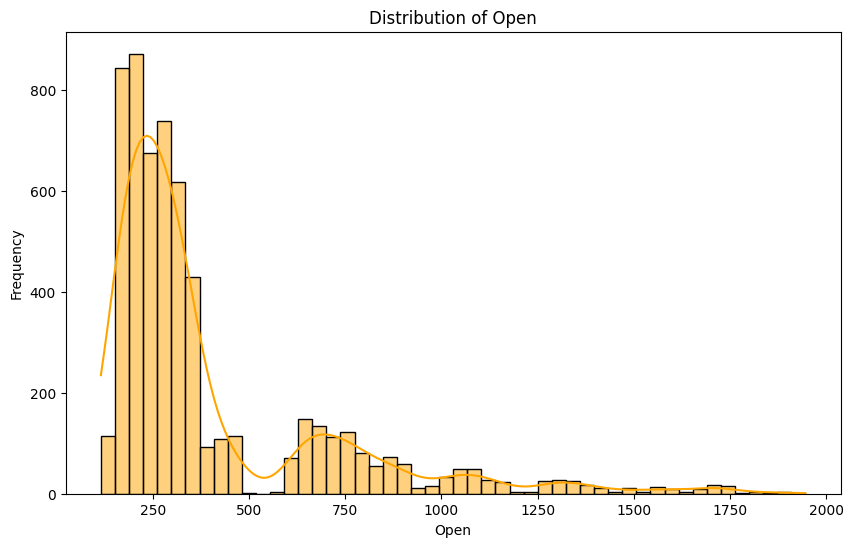

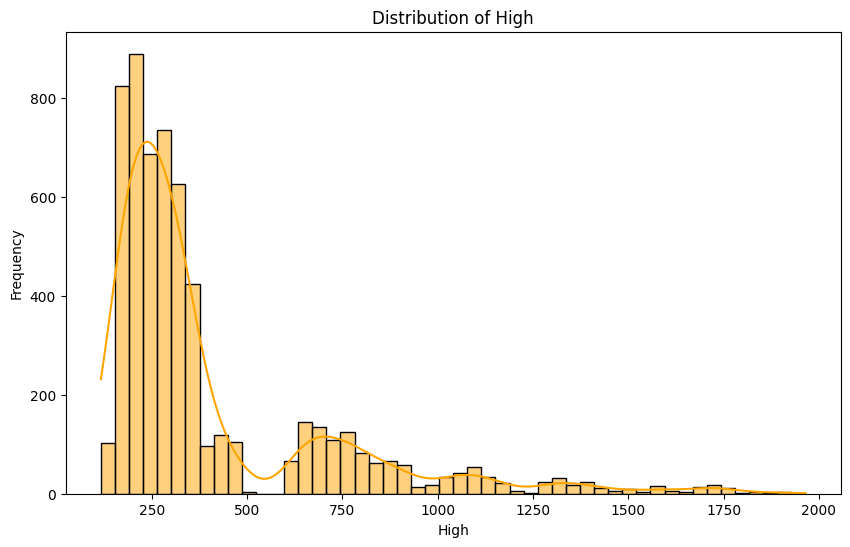

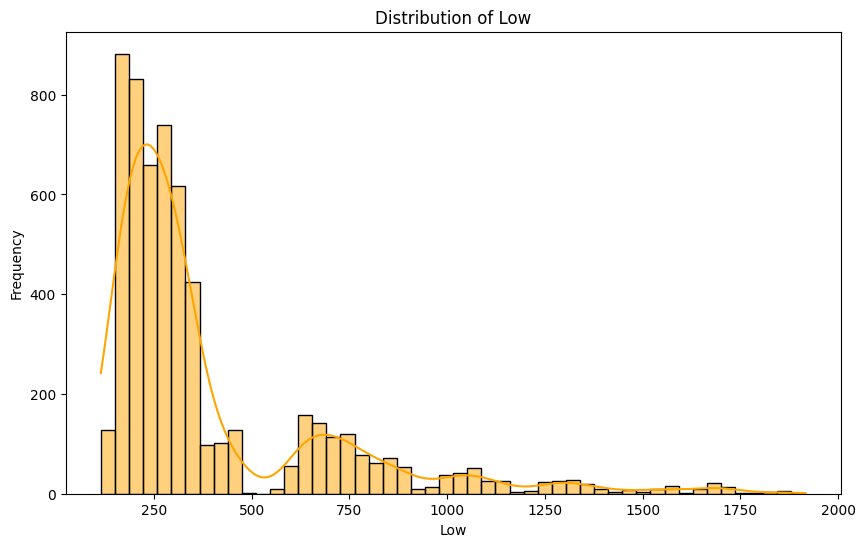

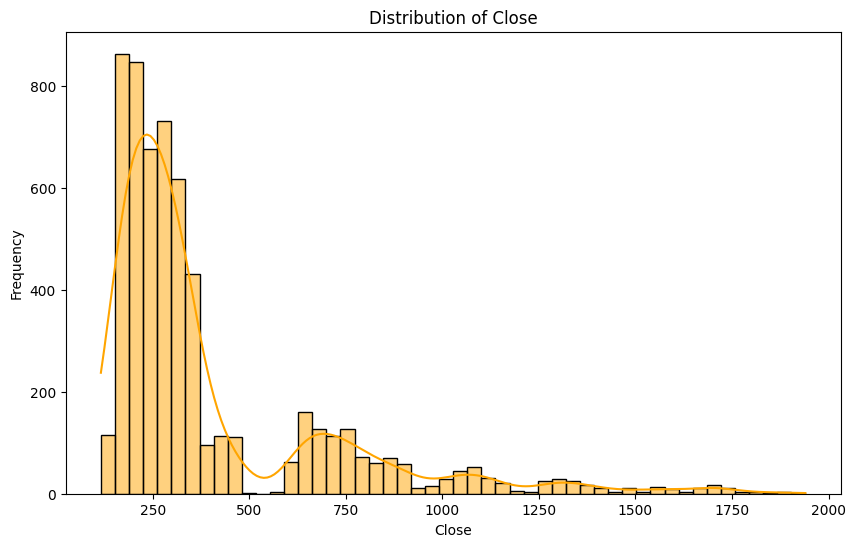

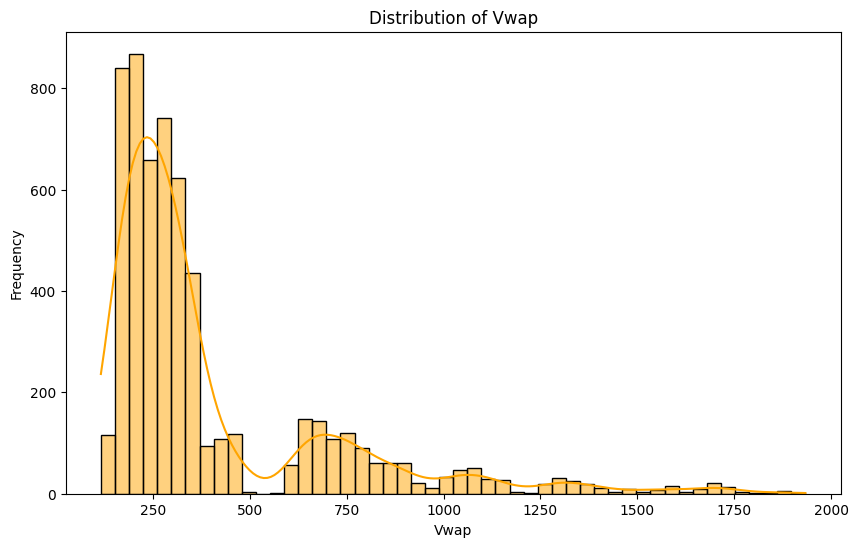

...

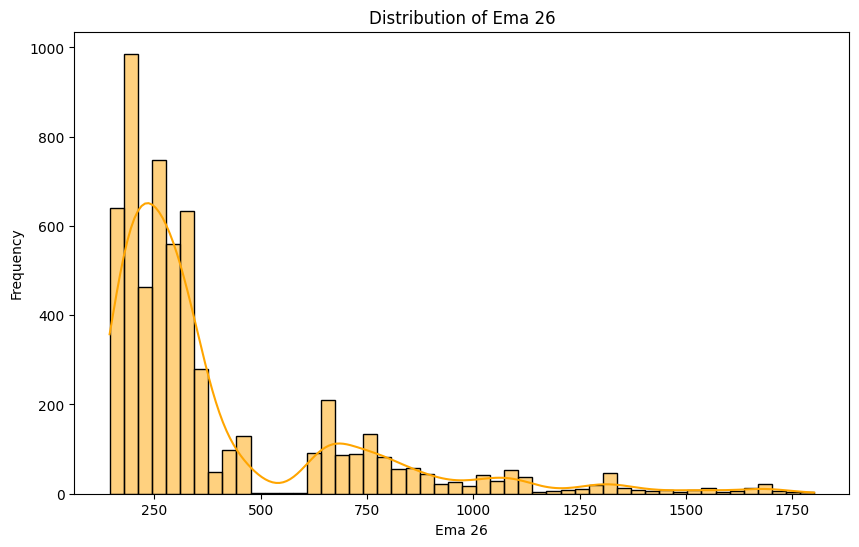

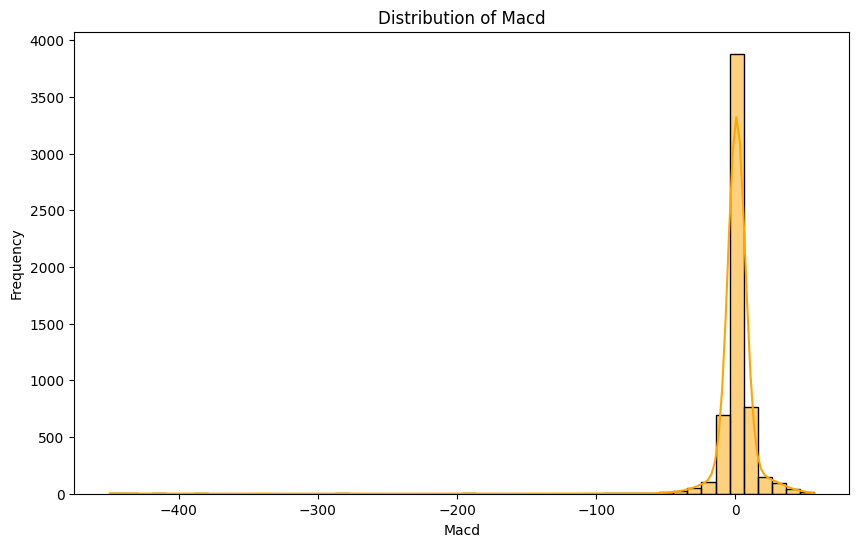

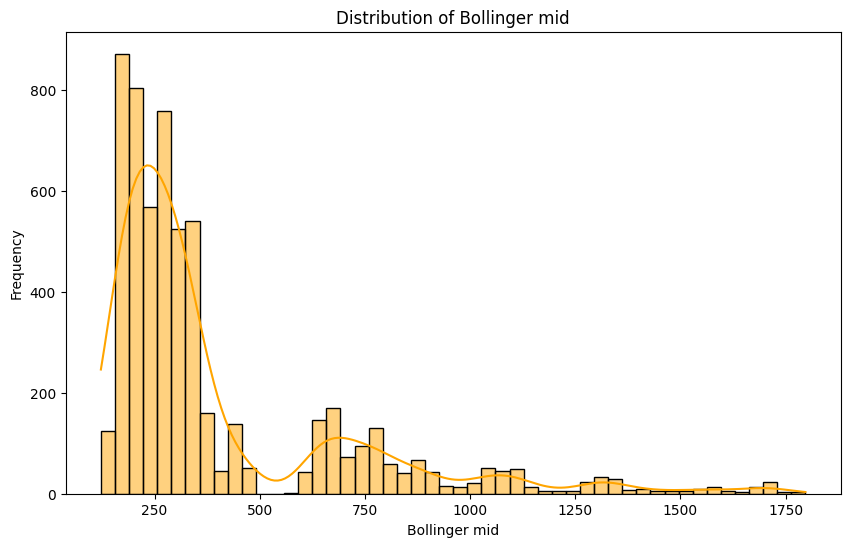

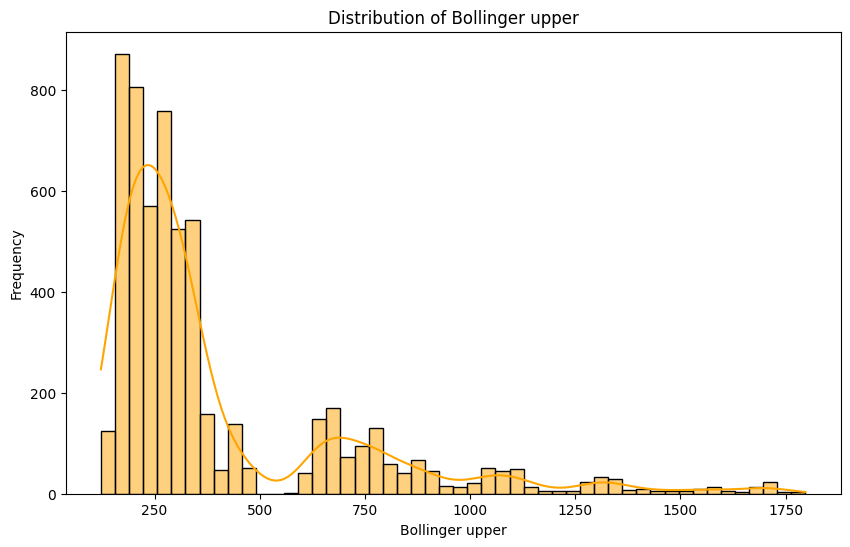

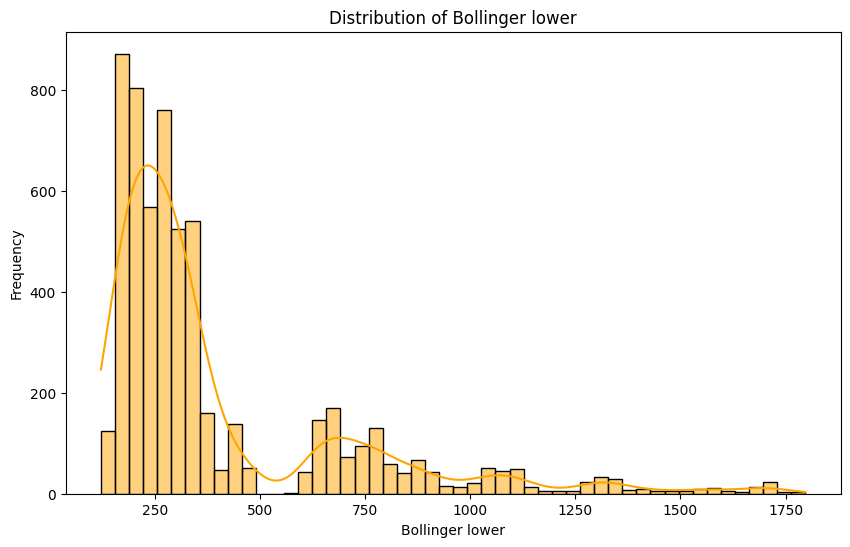

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of relevant numerical columns for EDA, including newly engineered features
columns = [
    'open', 'high', 'low', 'close', 'vwap', 'volume', 'value', '52w_h', '52w_l',
    'no_of_trades', 'MA_20', 'MA_50', 'Daily_Return', 'Lag_1', 'Lag_2',
    'Range', 'Volatility_20', 'Volatility_50', 'Lag_3', 'Price_Range',
    'RSI', 'EMA_12', 'EMA_26', 'MACD', 'Bollinger_Mid',
    'Bollinger_Upper', 'Bollinger_Lower'
]

# Generate histograms with KDE for each column
for column in columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(data[column], bins=50, kde=True, color='orange')
    plt.title(f'Distribution of {column.replace("_", " ").capitalize()}')
    plt.xlabel(column.replace('_', ' ').capitalize())
    plt.ylabel('Frequency')
    plt.show()

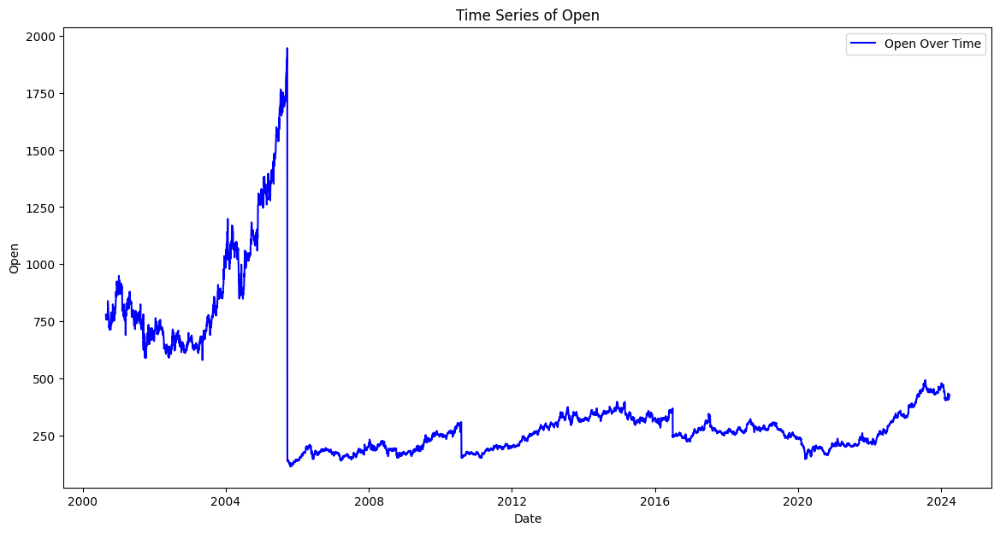

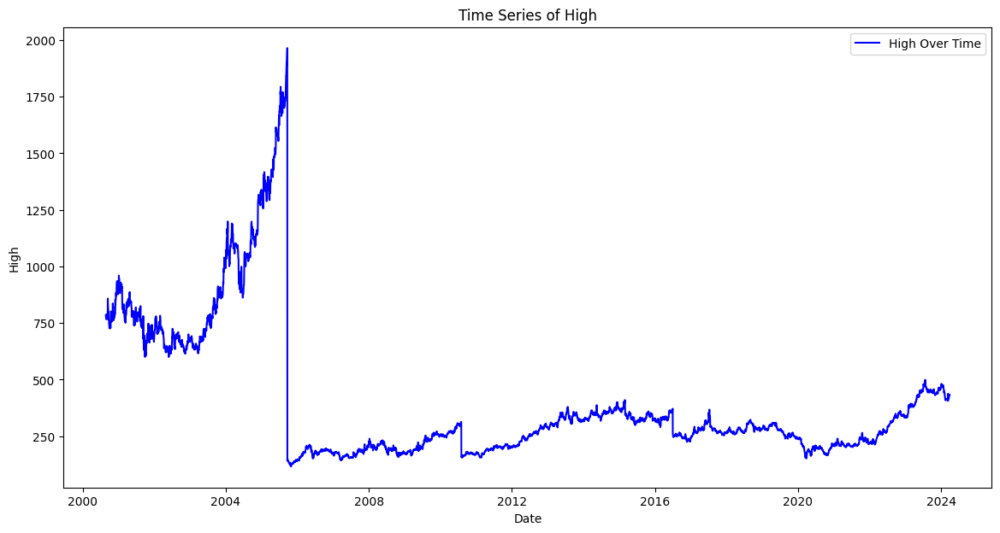

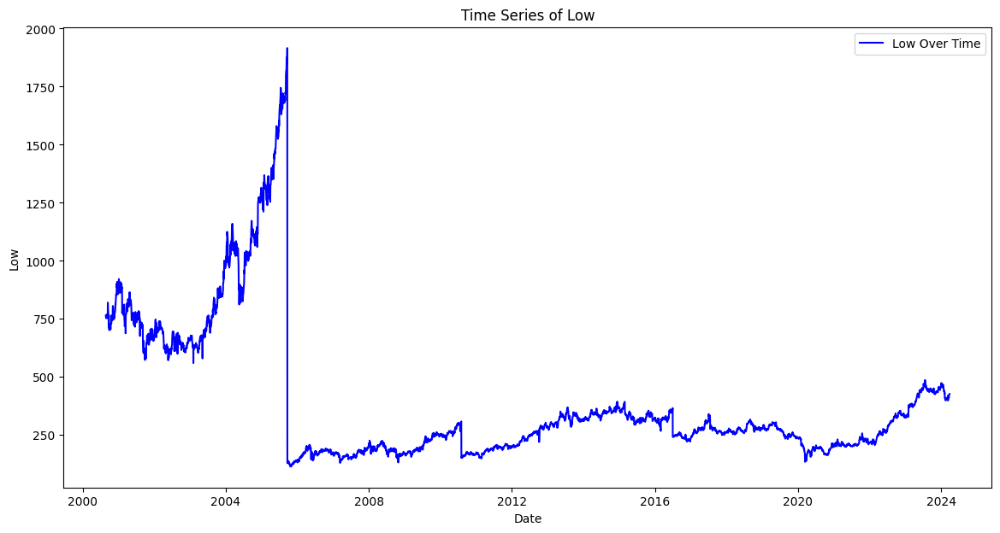

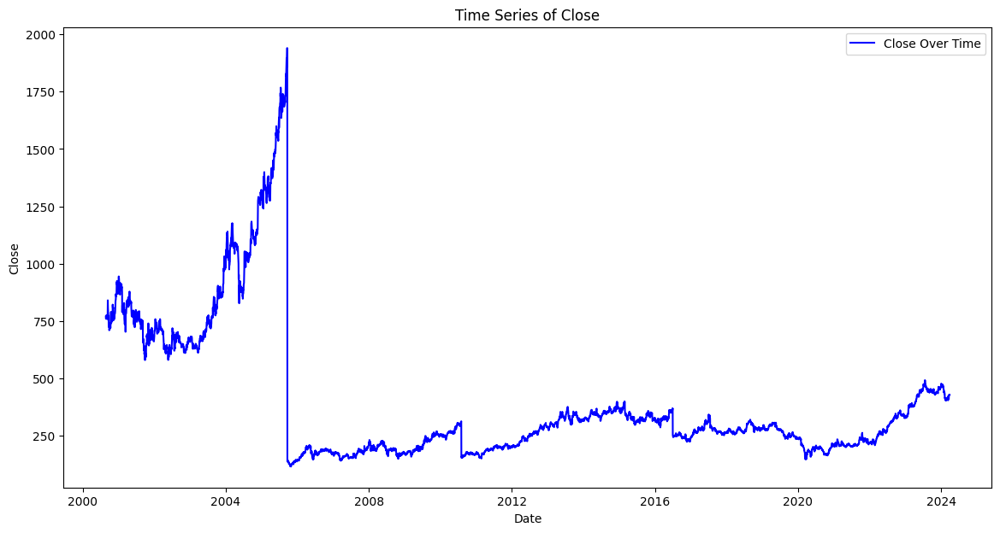

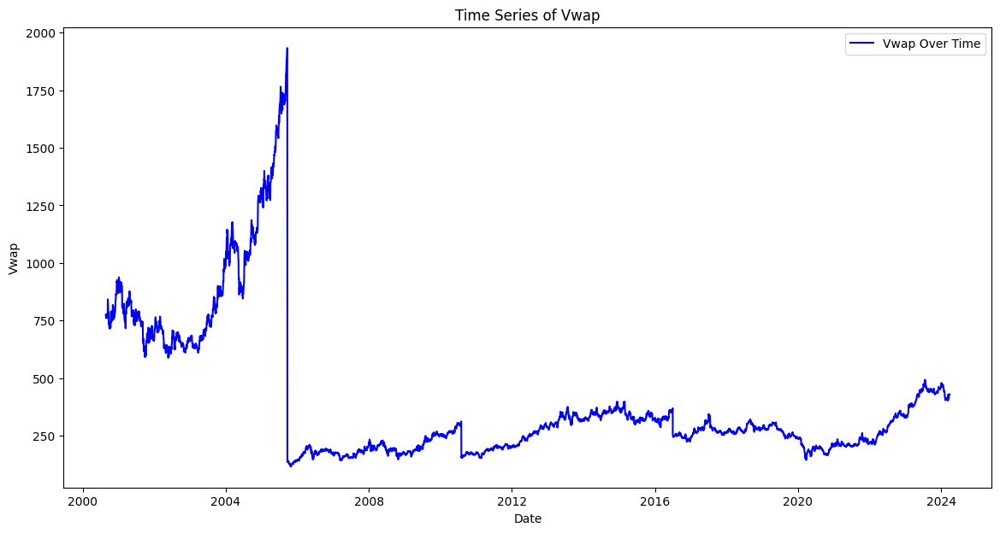

...

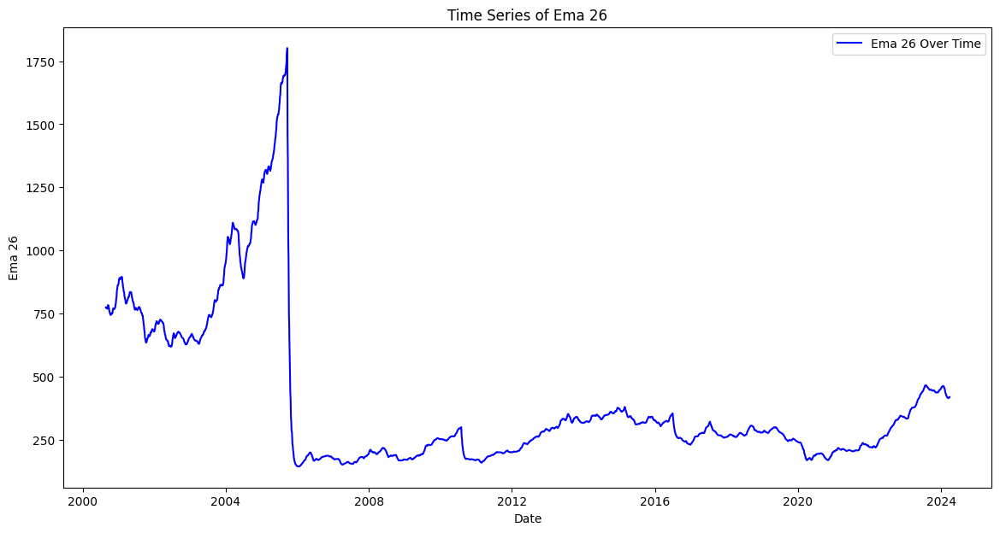

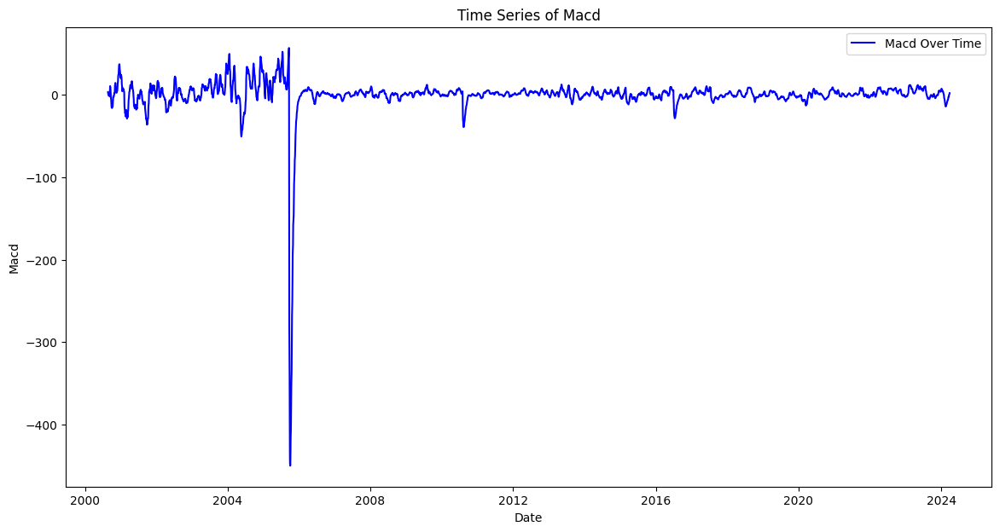

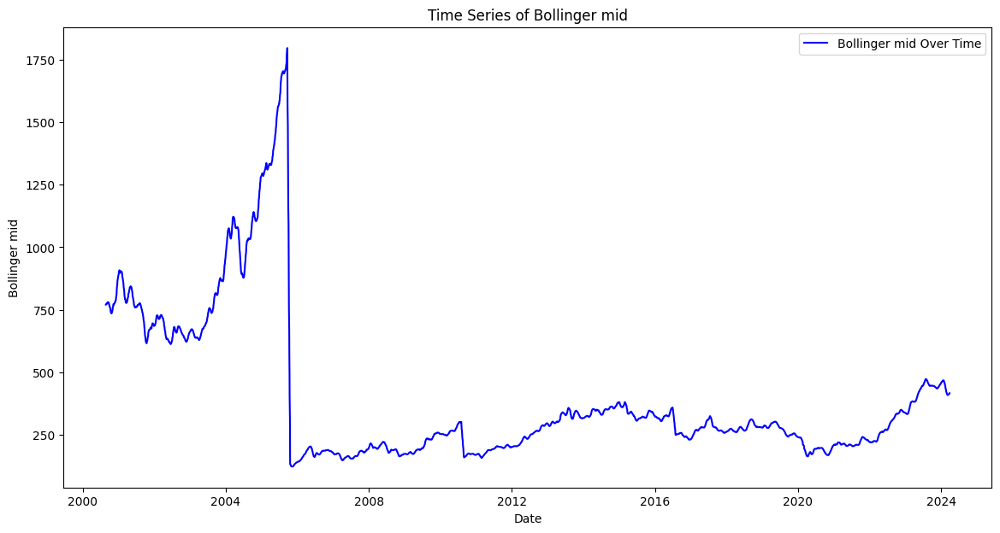

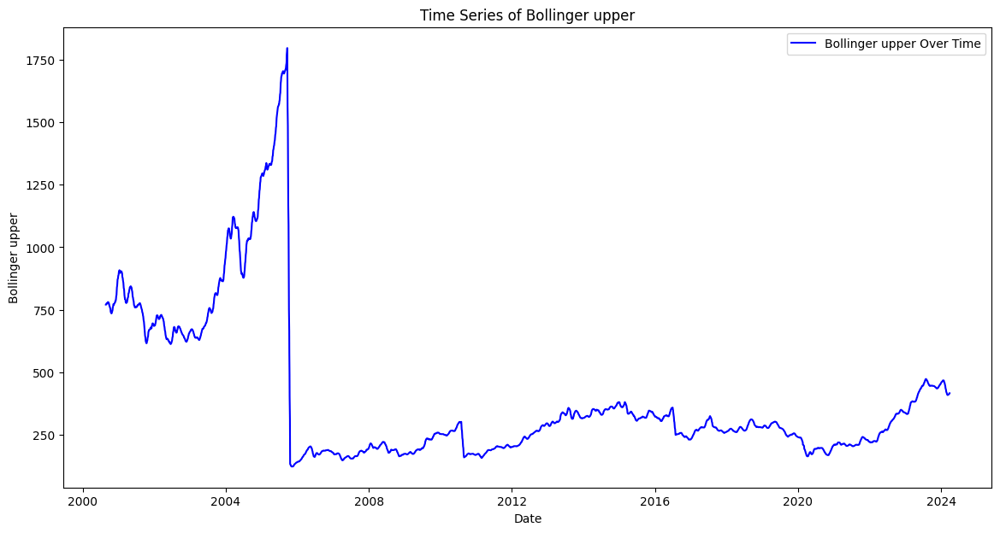

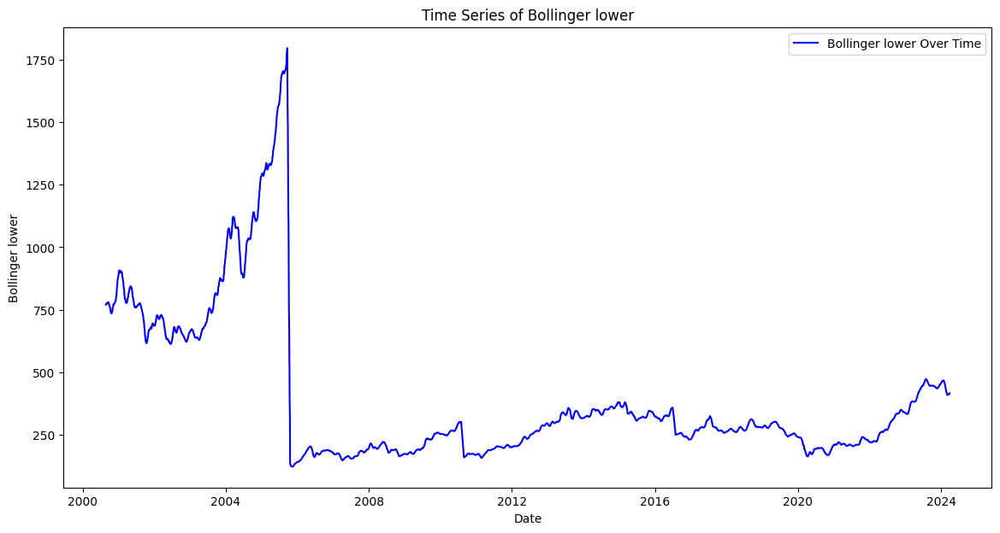

In [36]:
import matplotlib.pyplot as plt

# List of relevant columns for time series analysis, including newly engineered features
columns = [
    'open', 'high', 'low', 'close', 'vwap', 'volume', 'value', '52w_h', '52w_l',
    'no_of_trades', 'MA_20', 'MA_50', 'Daily_Return', 'Lag_1', 'Lag_2',
    'Range', 'Volatility_20', 'Volatility_50', 'Lag_3', 'Price_Range',
    'RSI', 'EMA_12', 'EMA_26', 'MACD', 'Bollinger_Mid',
    'Bollinger_Upper', 'Bollinger_Lower'
]

# Generate time series plots for each column
for column in columns:
    plt.figure(figsize=(14, 7))
    plt.plot(data['date'], data[column], label=f'{column.replace("_", " ").capitalize()} Over Time', color='blue')
    plt.title(f'Time Series of {column.replace("_", " ").capitalize()}')
    plt.xlabel('Date')
    plt.ylabel(column.replace('_', ' ').capitalize())
    plt.legend()
    plt.show()

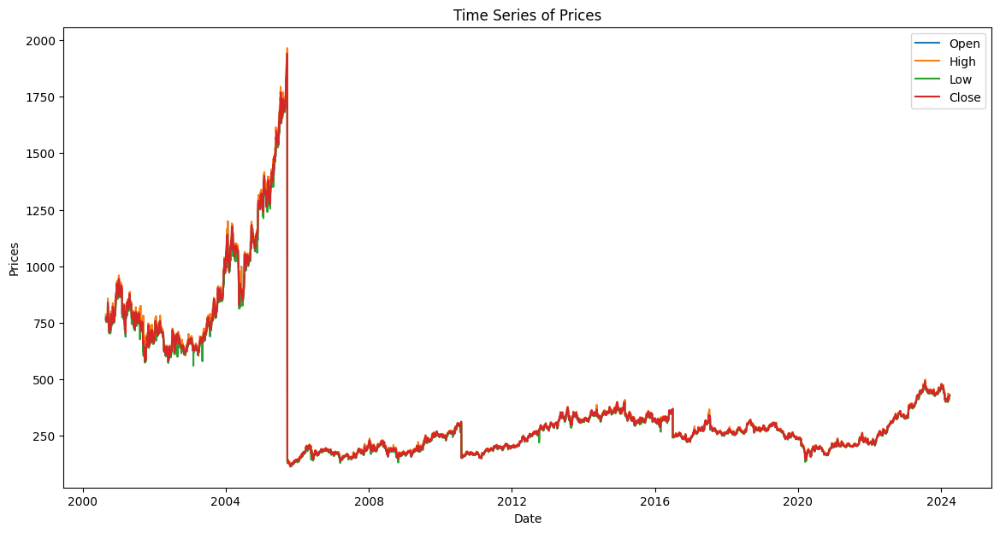

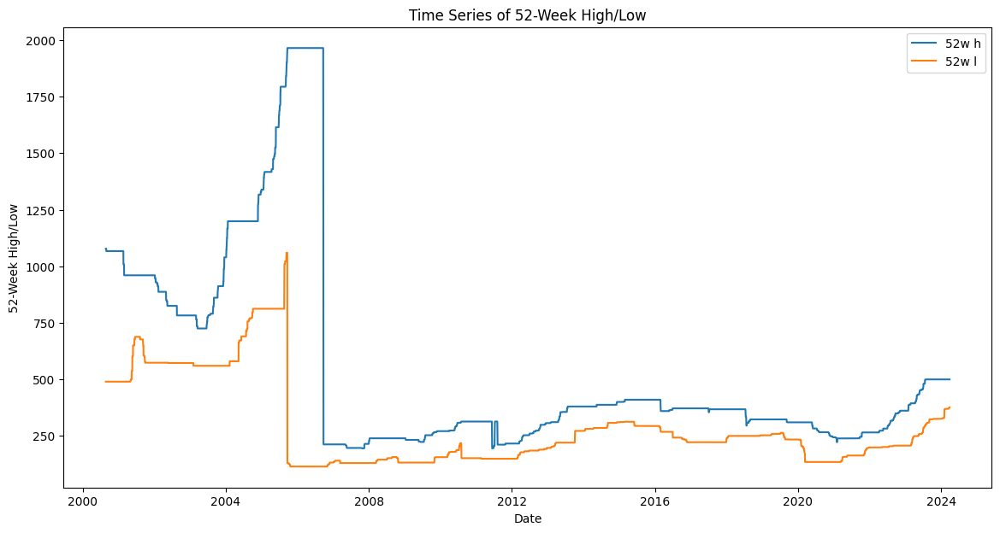

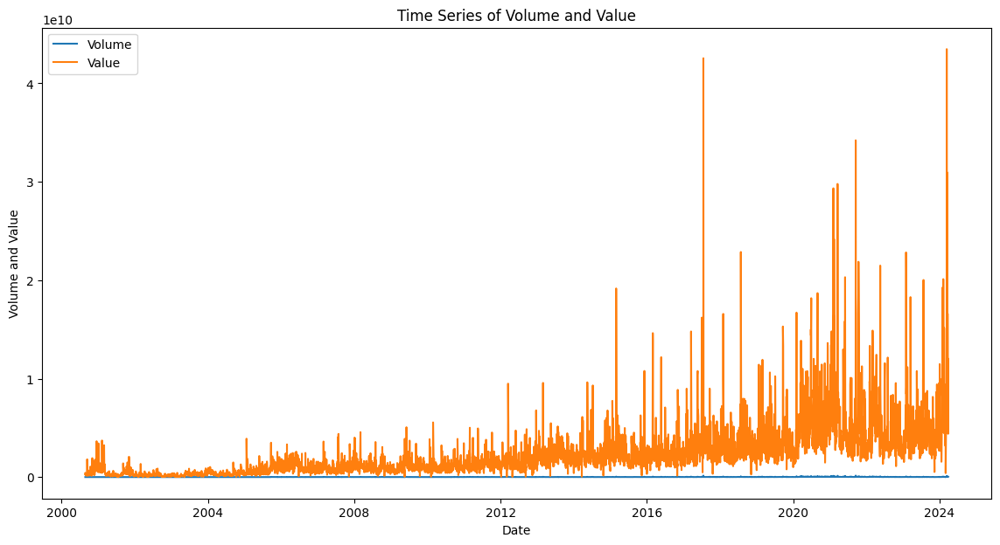

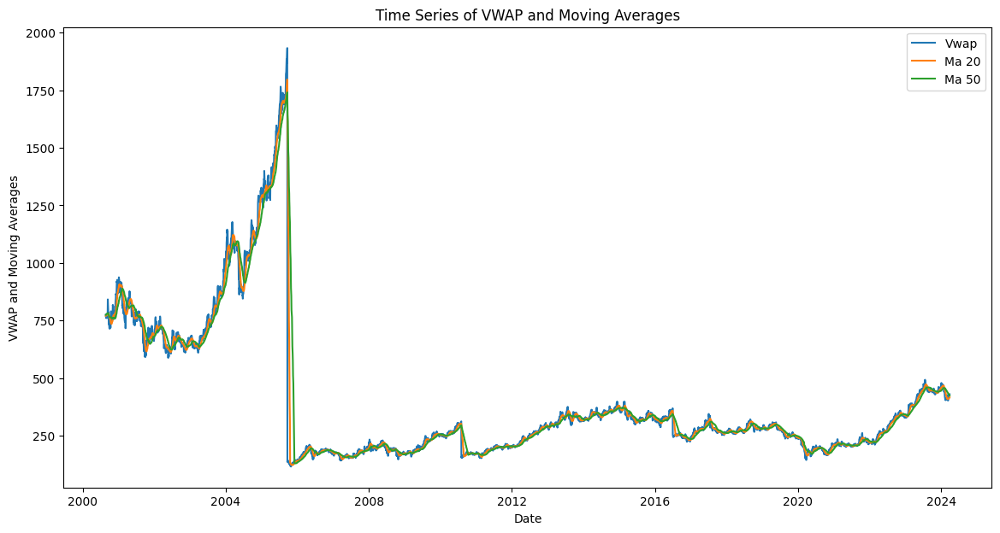

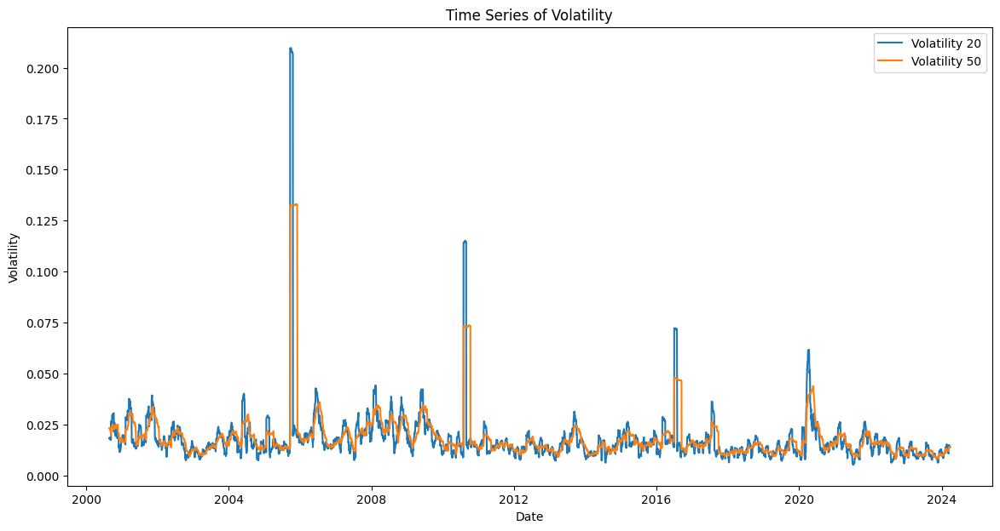

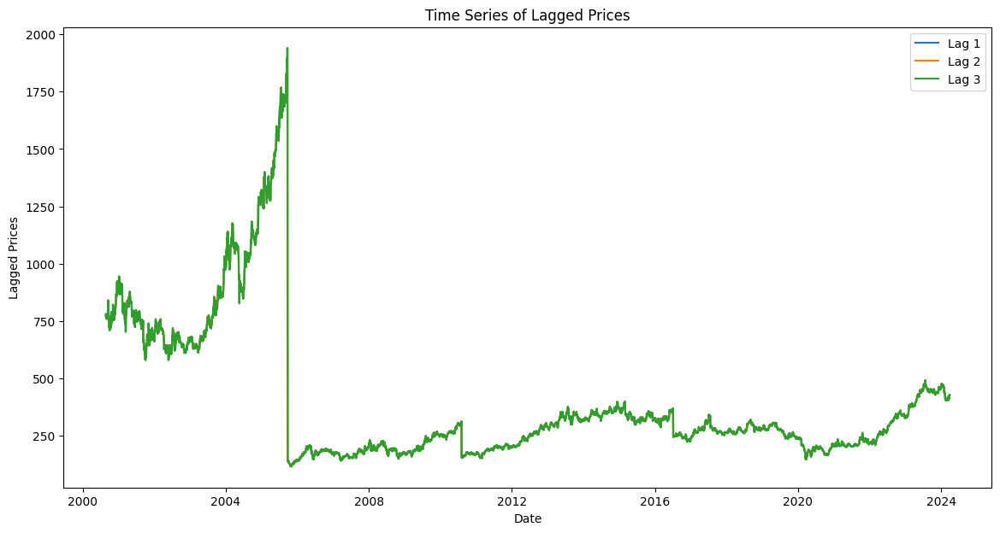

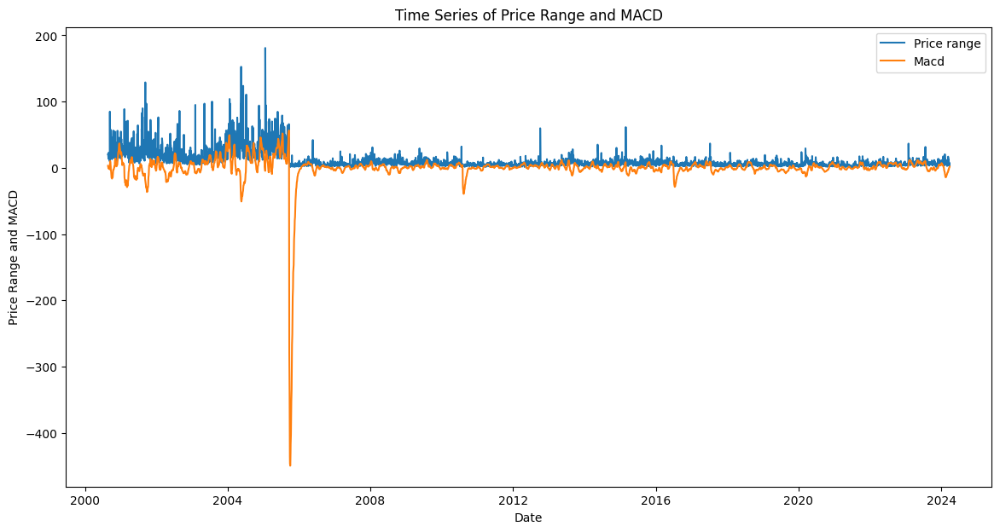

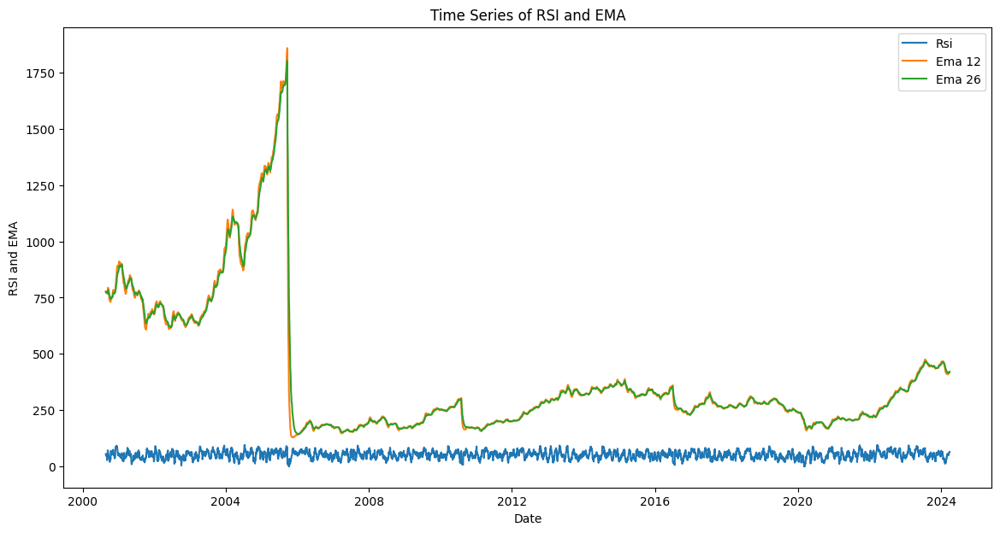

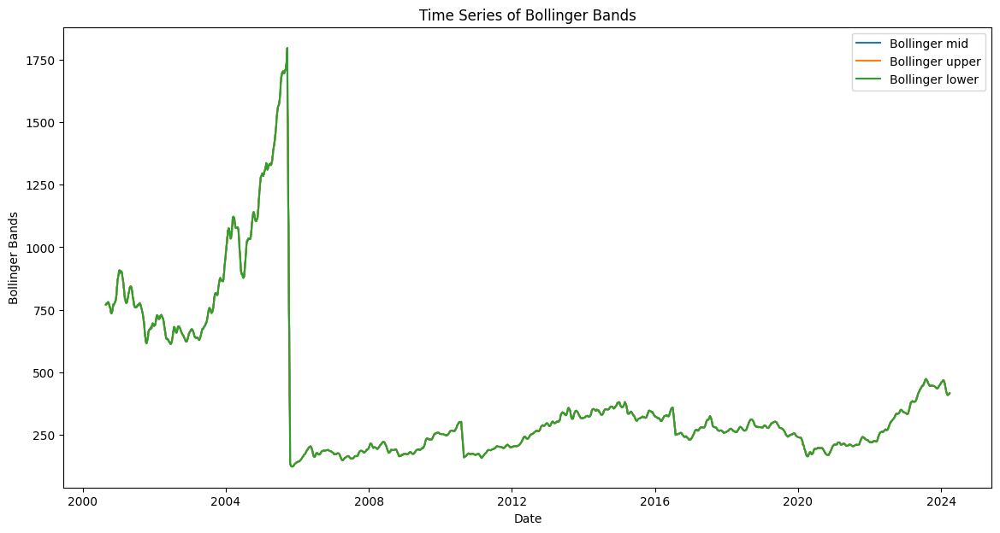

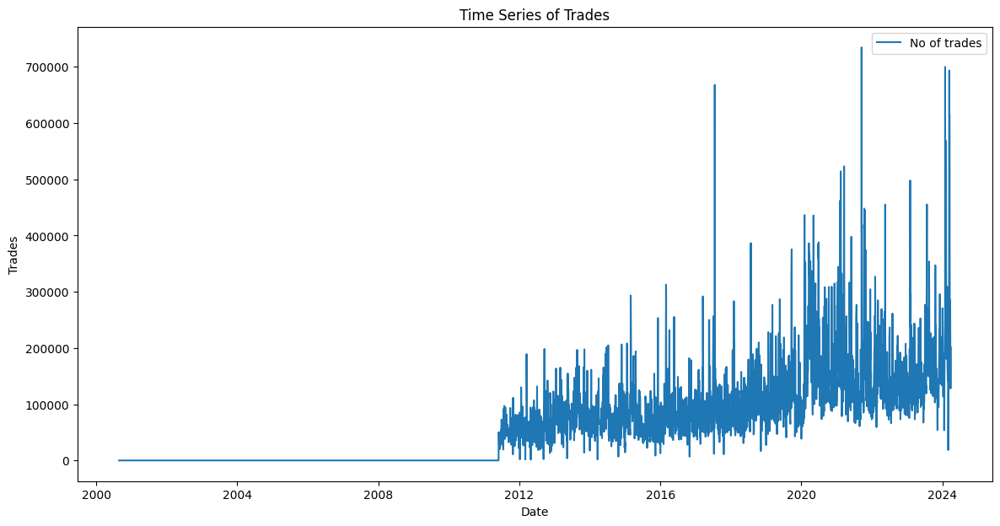

In [37]:
import matplotlib.pyplot as plt

# Updated dictionary of relevant columns to be plotted together
combined_columns = {
    'Prices': ['open', 'high', 'low', 'close'],
    '52-Week High/Low': ['52w_h', '52w_l'],
    'Volume and Value': ['volume', 'value'],
    'VWAP and Moving Averages': ['vwap', 'MA_20', 'MA_50'],
    'Volatility': ['Volatility_20', 'Volatility_50'],
    'Lagged Prices': ['Lag_1', 'Lag_2', 'Lag_3'],
    'Price Range and MACD': ['Price_Range', 'MACD'],
    'RSI and EMA': ['RSI', 'EMA_12', 'EMA_26'],
    'Bollinger Bands': ['Bollinger_Mid', 'Bollinger_Upper', 'Bollinger_Lower'],
    'Trades': ['no_of_trades']
}

# Generate combined time series plots for each group
for key, columns in combined_columns.items():
    plt.figure(figsize=(14, 7))
    for column in columns:
        plt.plot(data['date'], data[column], label=column.replace('_', ' ').capitalize())
    plt.title(f'Time Series of {key}')
    plt.xlabel('Date')
    plt.ylabel(f'{key}')
    plt.legend()
    plt.show()

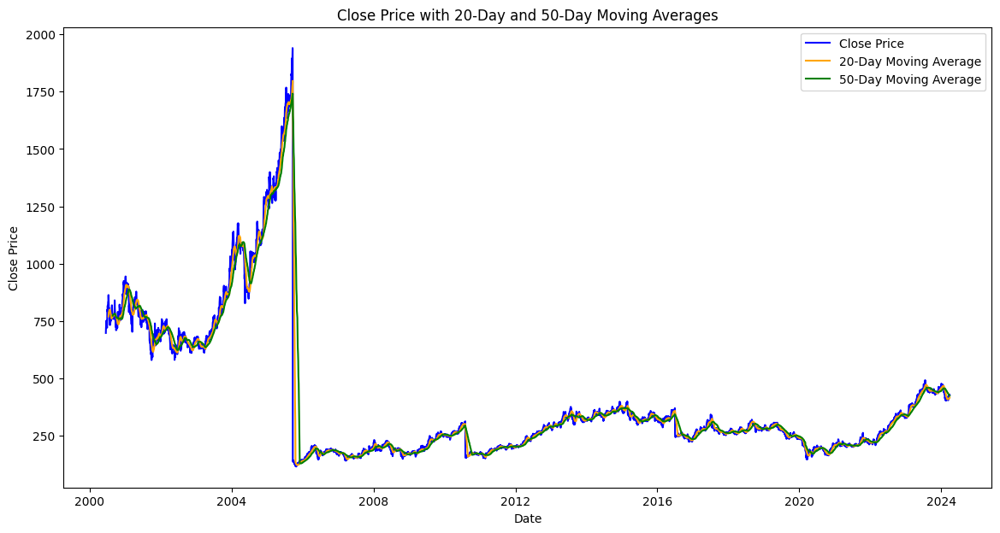

In [18]:
# Calculate Moving Averages
data['MA_20'] = data['close'].rolling(window=20).mean()
data['MA_50'] = data['close'].rolling(window=50).mean()

plt.figure(figsize=(14, 7))
plt.plot(data['date'], data['close'], label='Close Price', color='blue')
plt.plot(data['date'], data['MA_20'], label='20-Day Moving Average', color='orange')
plt.plot(data['date'], data['MA_50'], label='50-Day Moving Average', color='green')
plt.title('Close Price with 20-Day and 50-Day Moving Averages')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

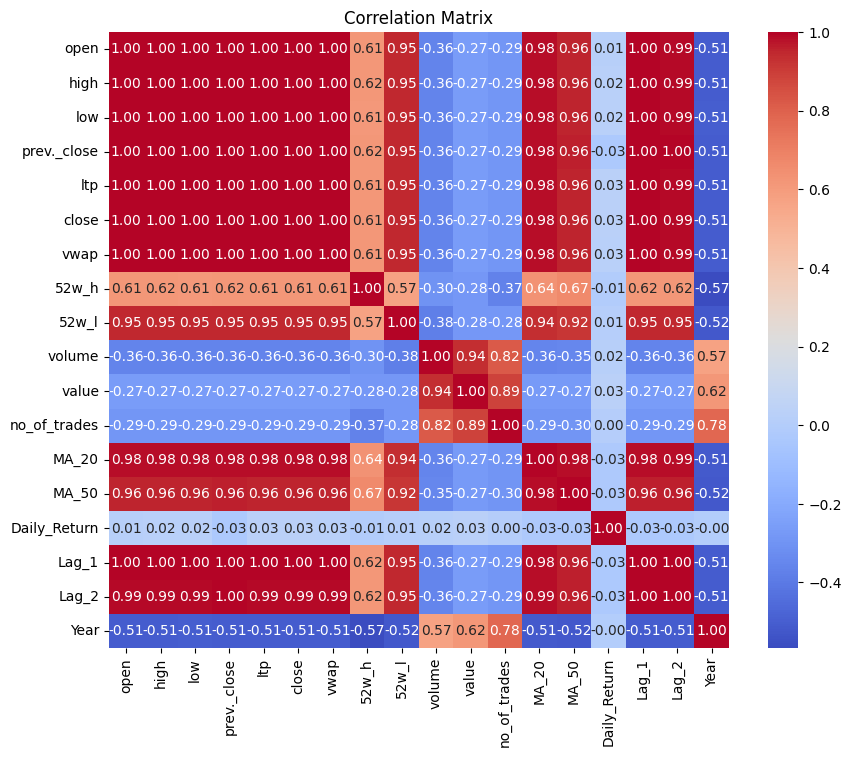

In [19]:
# Select only numeric columns
numeric_data = data.select_dtypes(include=[np.number])

# Correlation Matrix Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_data.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

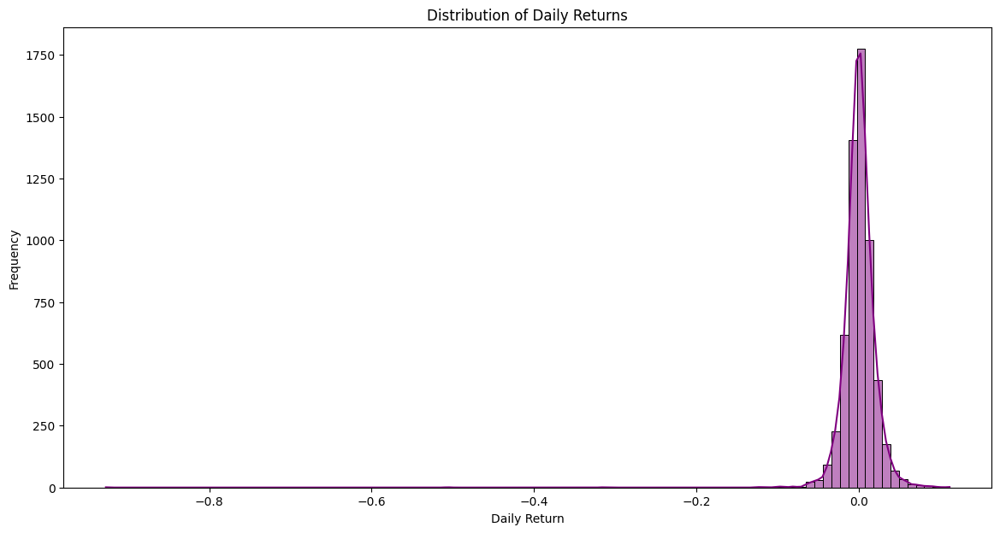

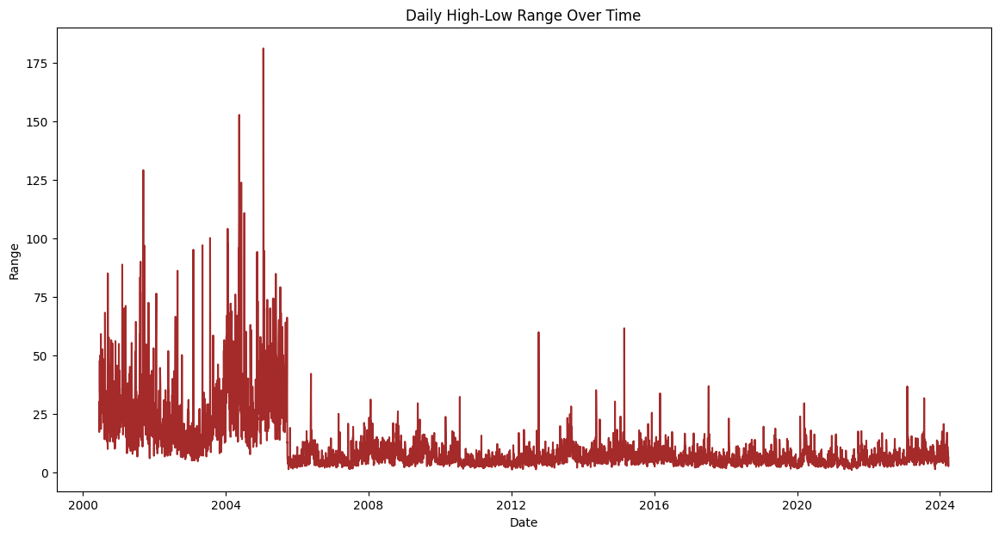

In [20]:
# Calculate Daily Returns
data['Daily_Return'] = data['close'].pct_change()

plt.figure(figsize=(14, 7))
sns.histplot(data['Daily_Return'].dropna(), bins=100, kde=True, color='purple')
plt.title('Distribution of Daily Returns')
plt.xlabel('Daily Return')
plt.ylabel('Frequency')
plt.show()

data['Range'] = data['high'] - data['low']

plt.figure(figsize=(14, 7))
sns.lineplot(x='date', y='Range', data=data, color='brown')
plt.title('Daily High-Low Range Over Time')
plt.xlabel('Date')
plt.ylabel('Range')
plt.show()


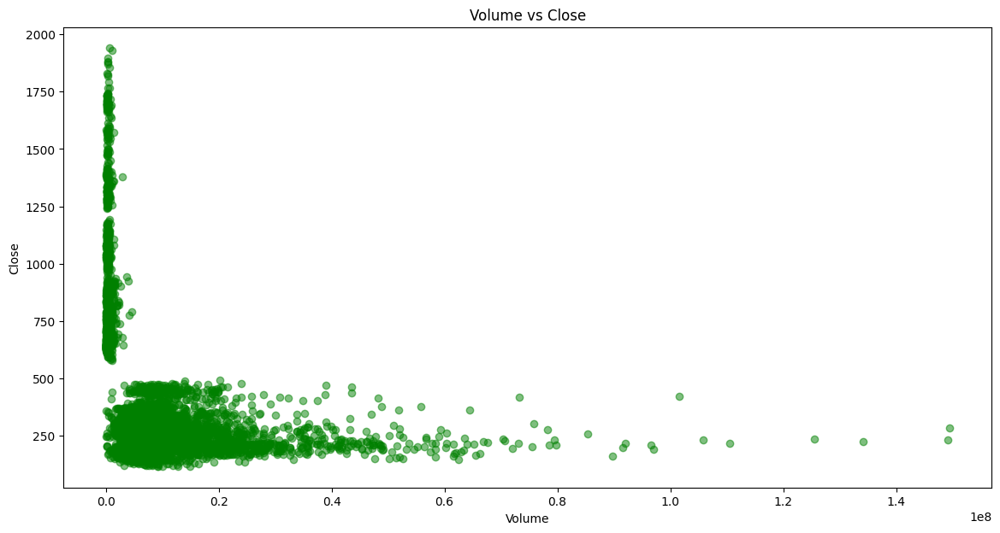

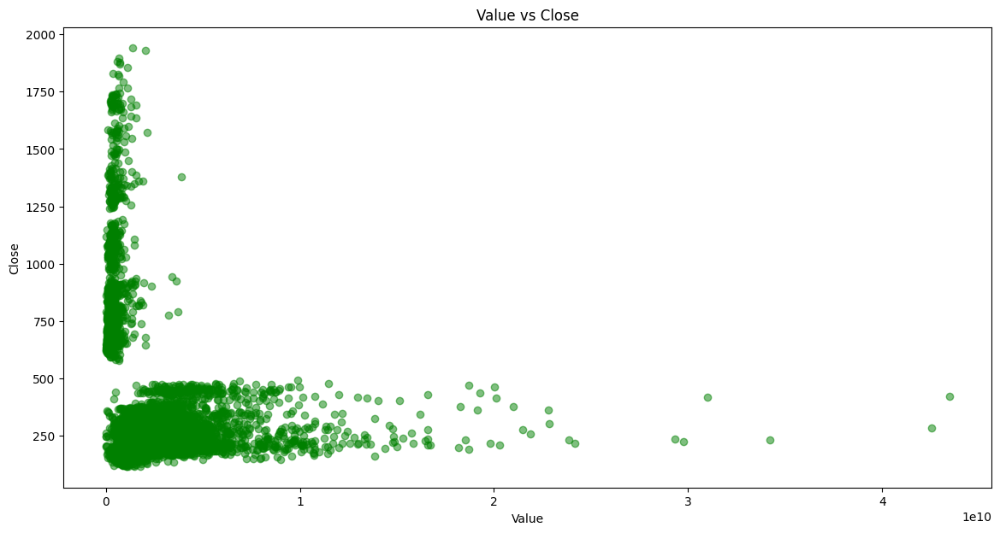

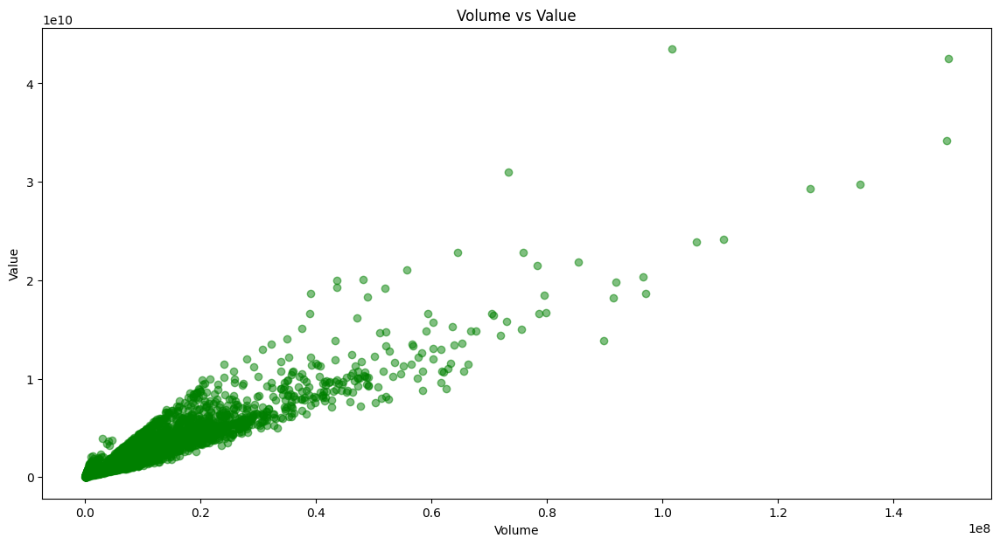

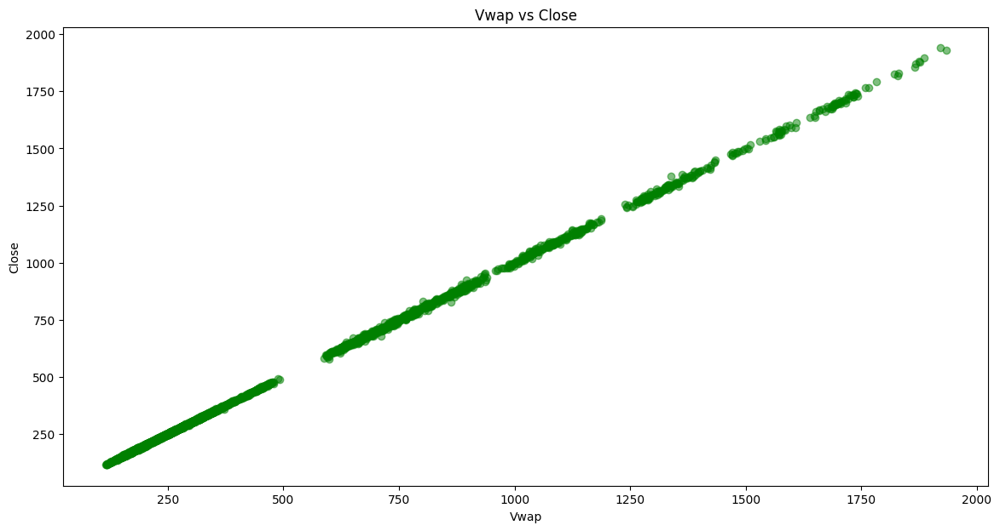

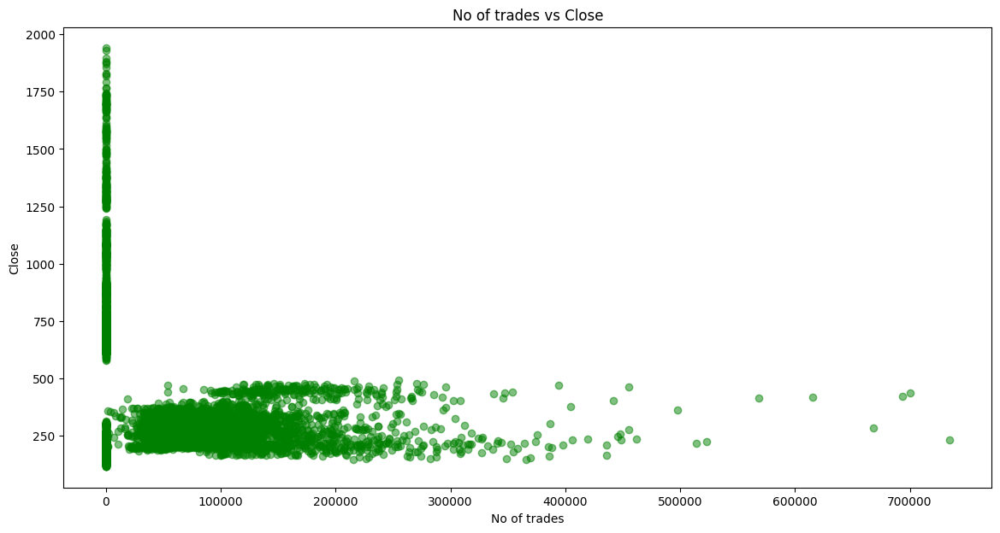

...

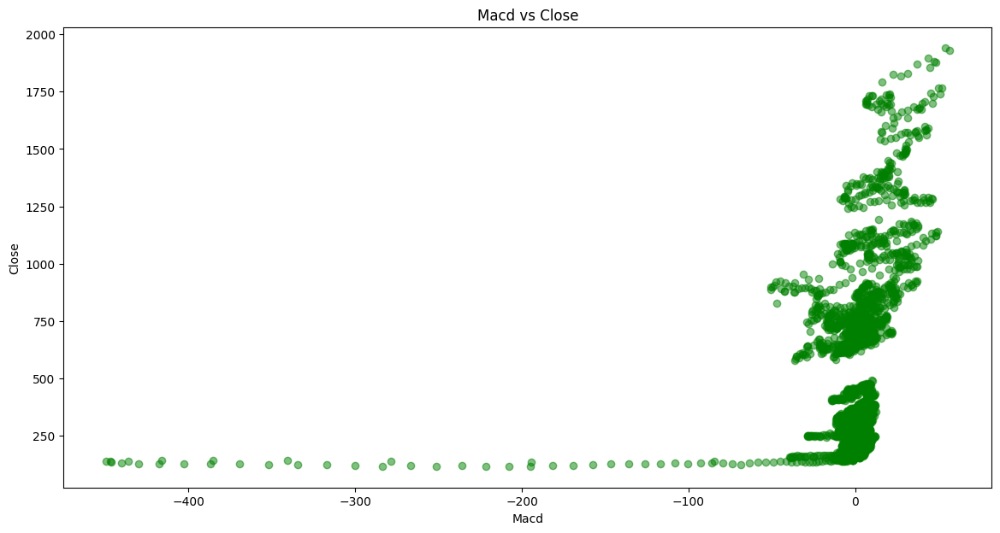

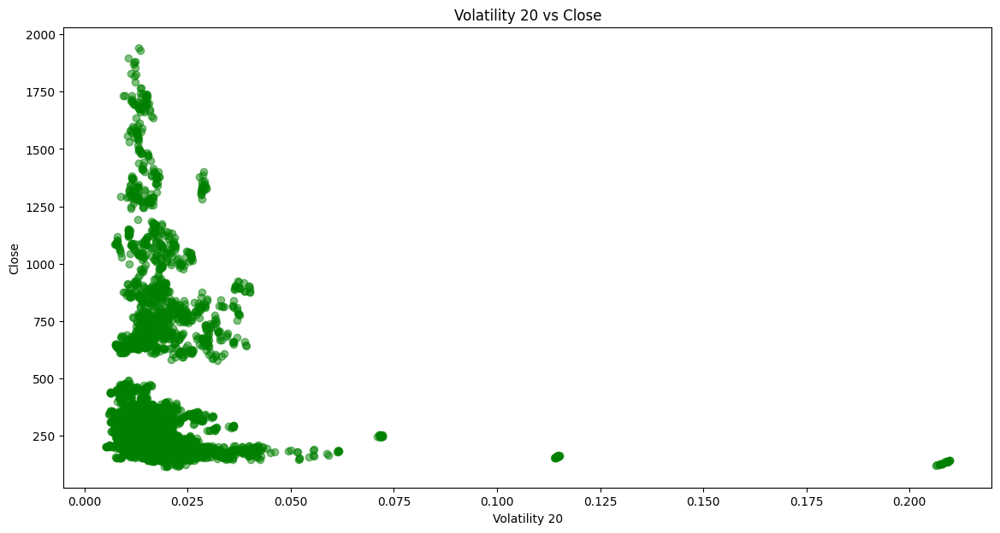

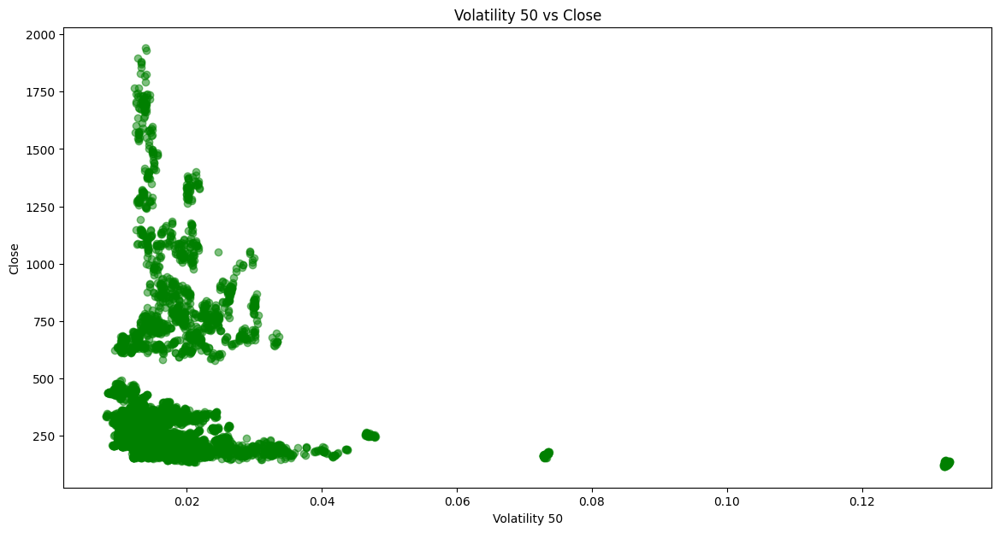

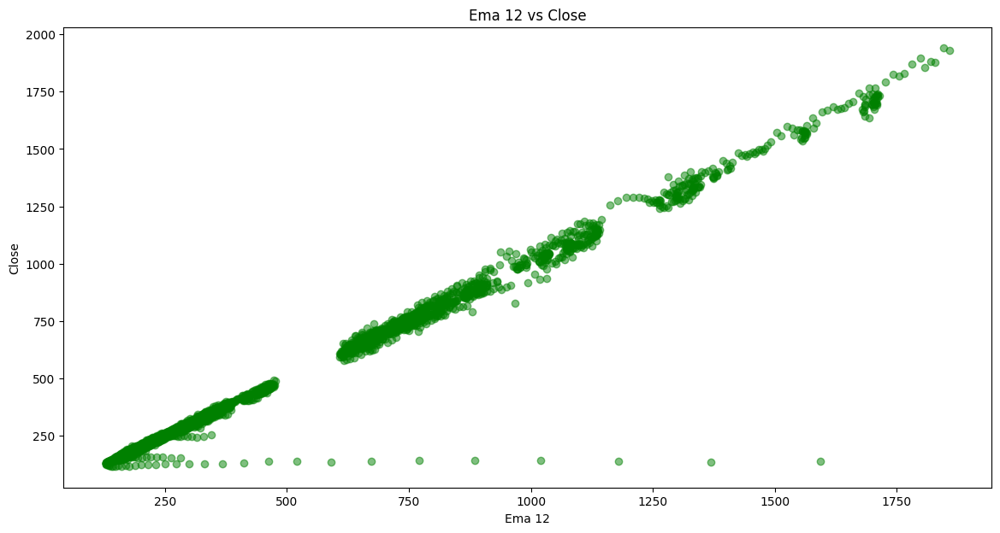

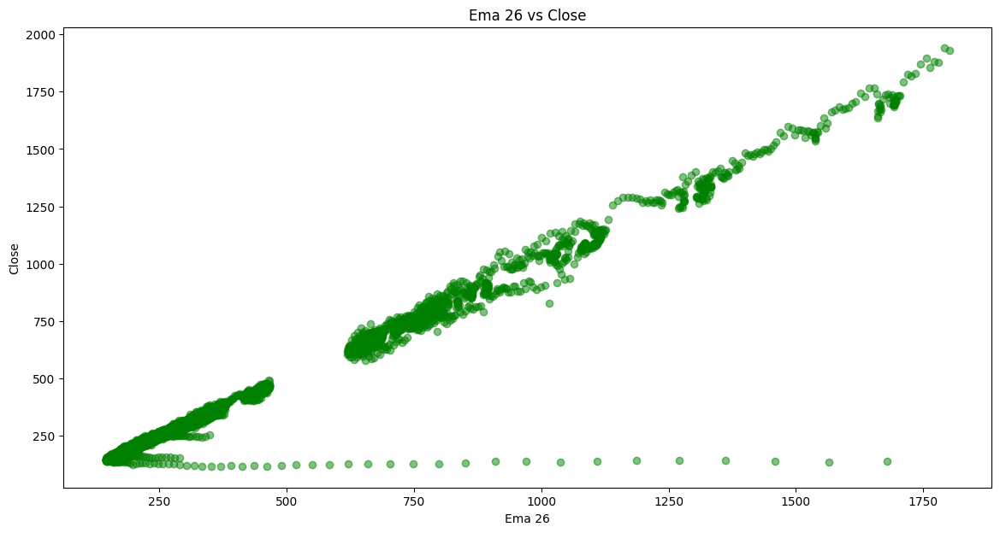

In [38]:
import matplotlib.pyplot as plt

# Updated list of relevant pairs of columns for scatter plots
scatter_columns = [
    ('volume', 'close'),
    ('value', 'close'),
    ('volume', 'value'),
    ('vwap', 'close'),
    ('no_of_trades', 'close'),
    ('volume', 'vwap'),
    ('value', 'vwap'),
    ('no_of_trades', 'volume'),
    ('RSI', 'close'),
    ('MACD', 'close'),
    ('Volatility_20', 'close'),
    ('Volatility_50', 'close'),
    ('EMA_12', 'close'),
    ('EMA_26', 'close')
]

# Generate scatter plots for each pair of columns
for x_col, y_col in scatter_columns:
    plt.figure(figsize=(14, 7))
    plt.scatter(data[x_col], data[y_col], alpha=0.5, color='green')
    plt.title(f'{x_col.replace("_", " ").capitalize()} vs {y_col.replace("_", " ").capitalize()}')
    plt.xlabel(x_col.replace('_', ' ').capitalize())
    plt.ylabel(y_col.replace('_', ' ').capitalize())
    plt.show()

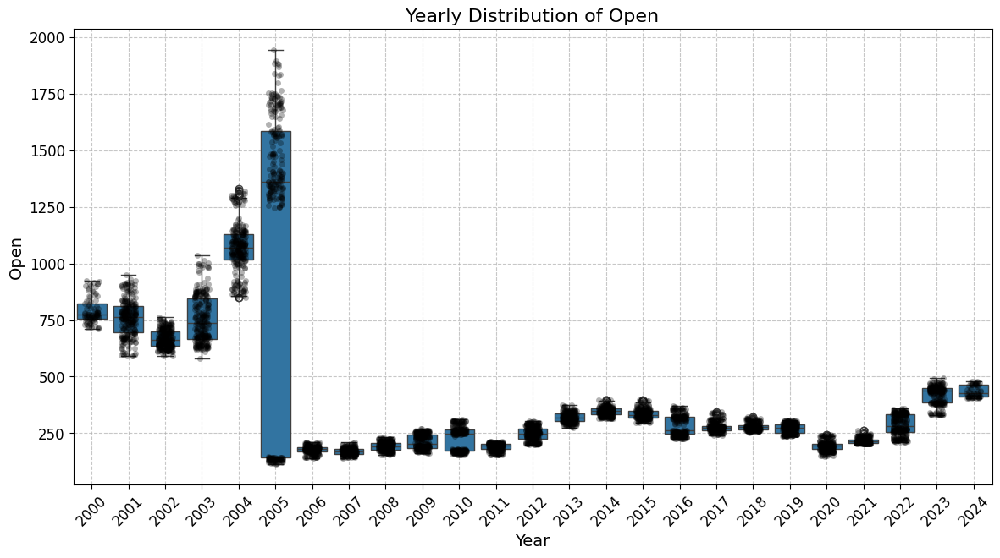

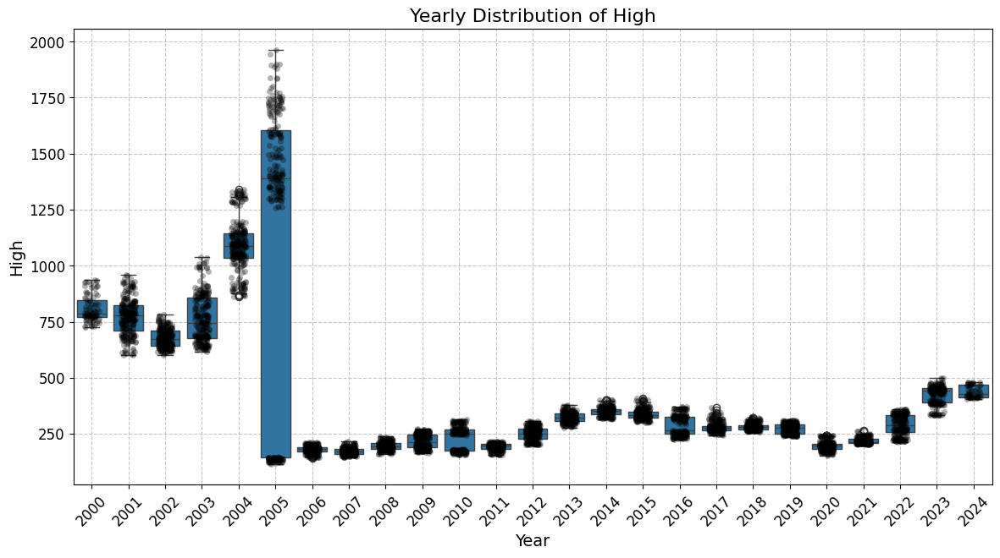

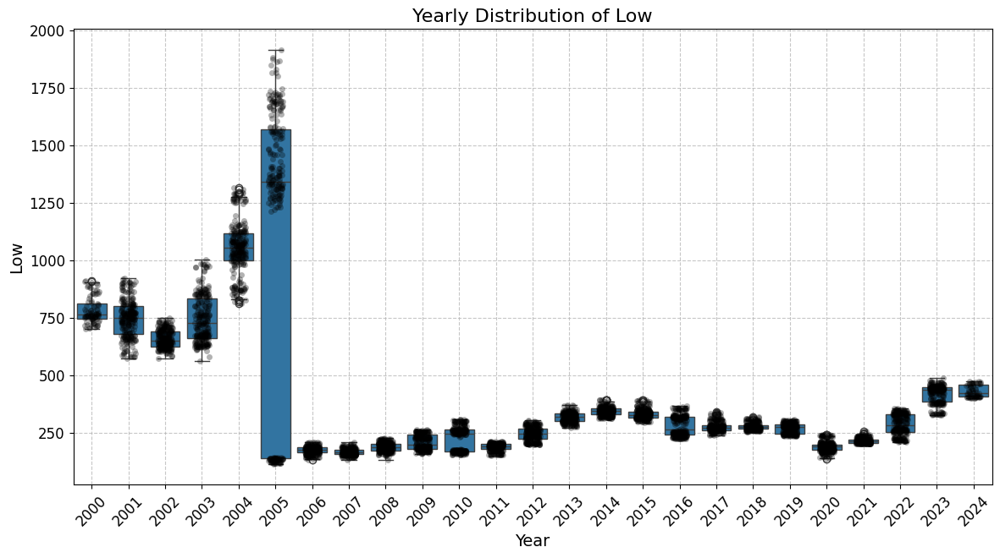

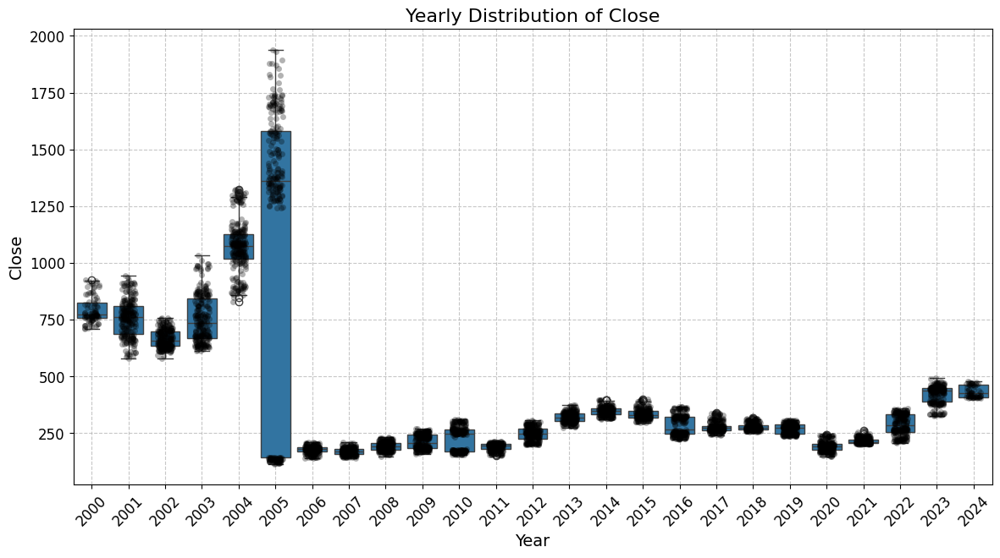

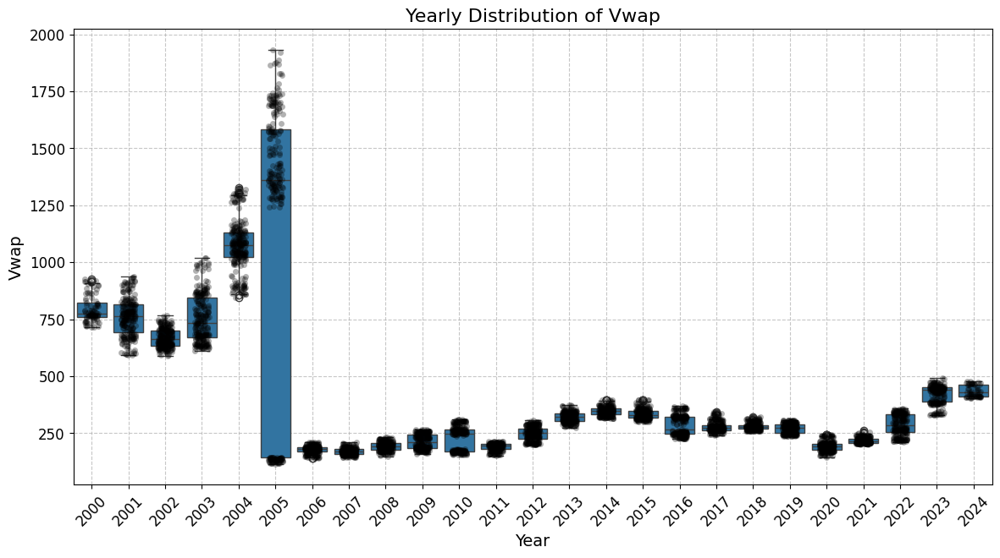

...

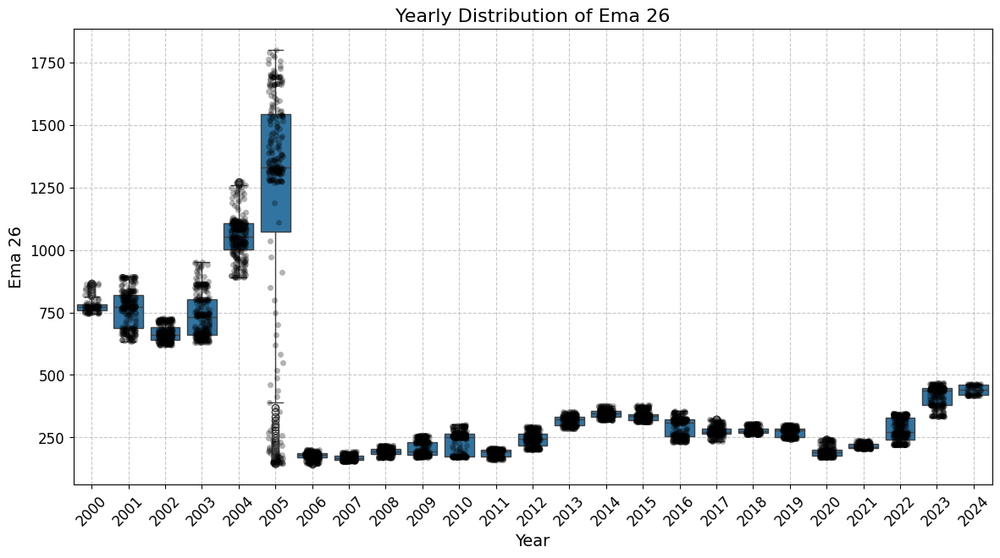

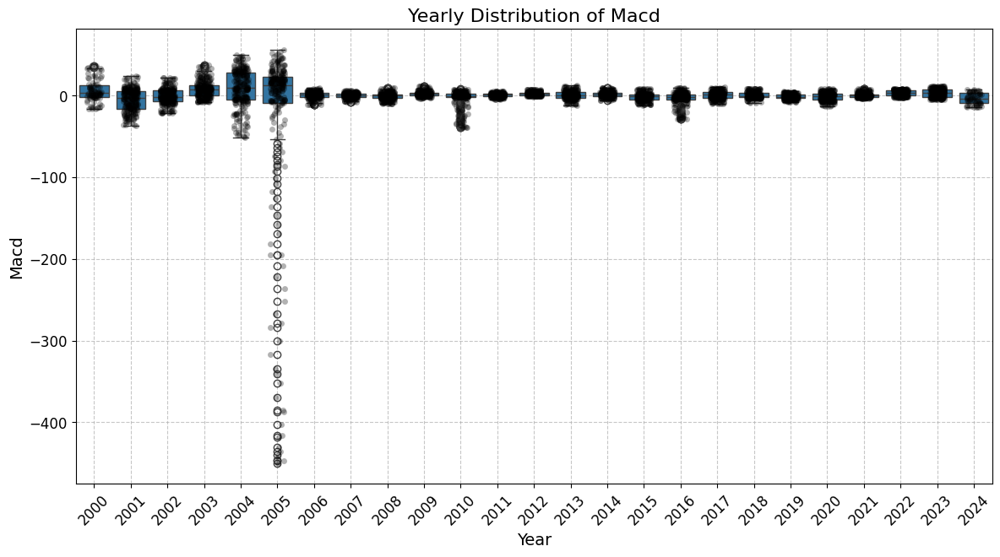

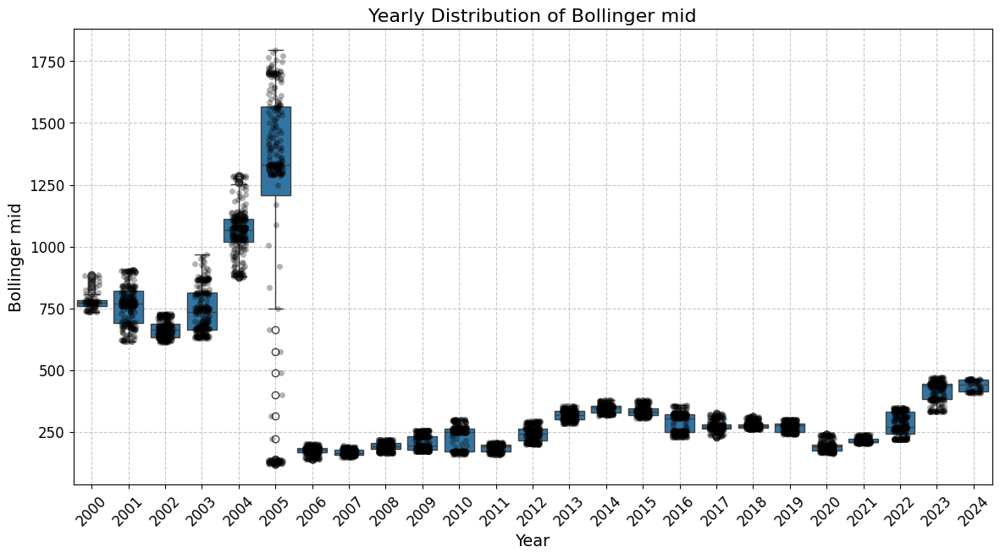

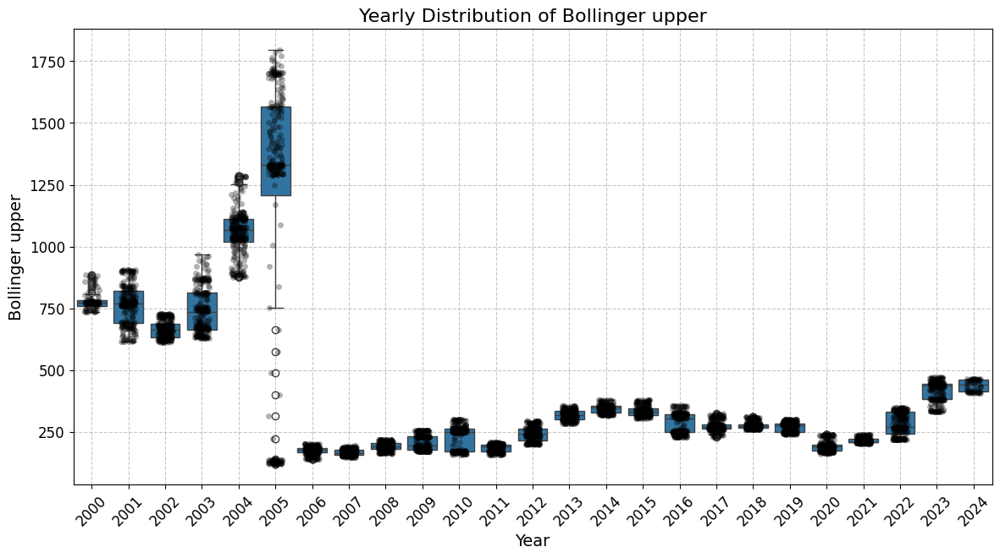

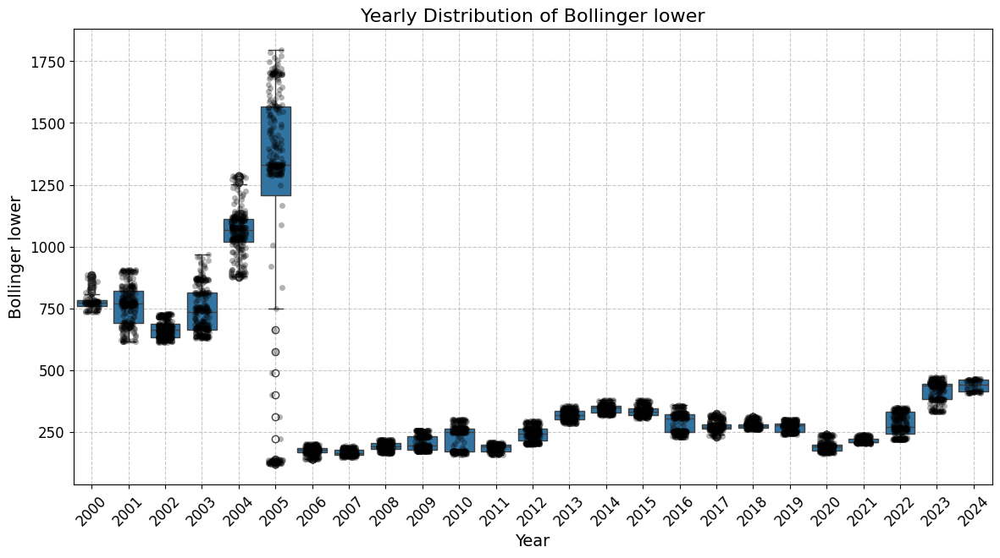

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns

# Add a 'Year' column to the dataset (if not already added)
data['Year'] = data['date'].dt.year

# List of relevant columns for yearly distribution analysis
columns = [
    'open', 'high', 'low', 'close', 'vwap', 'volume', 'value',
    '52w_h', '52w_l', 'no_of_trades', 'MA_20', 'MA_50',
    'Daily_Return', 'Range', 'Volatility_20', 'Volatility_50',
    'Price_Range', 'RSI', 'EMA_12', 'EMA_26', 'MACD',
    'Bollinger_Mid', 'Bollinger_Upper', 'Bollinger_Lower'
]

# Generate boxplots for each column
for column in columns:
    plt.figure(figsize=(14, 7))
    sns.boxplot(x='Year', y=column, data=data)
    sns.stripplot(x='Year', y=column, data=data, color='black', alpha=0.3, jitter=0.2)
    plt.title(f'Yearly Distribution of {column.replace("_", " ").capitalize()}', fontsize=16)
    plt.xlabel('Year', fontsize=14)
    plt.ylabel(column.replace('_', ' ').capitalize(), fontsize=14)
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()


## Trend Analysis

Linear Regression - MSE: 15.548958179042023, R2: 0.9998472749634437
Random Forest - MSE: 33.3390206040783, R2: 0.9996725373441822
Support Vector Regression - MSE: 117076.08986338344, R2: -0.14994521808897487


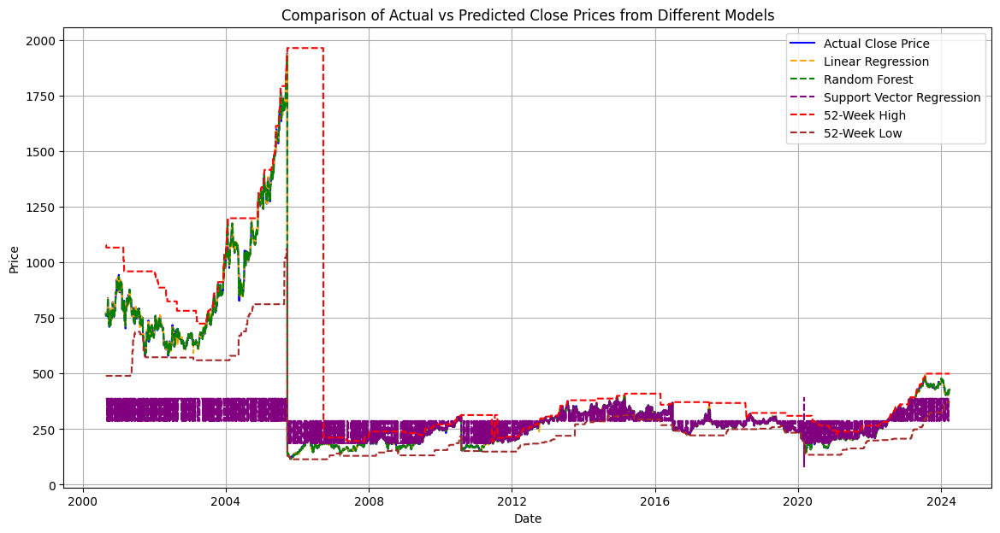

Model Performance Summary:
Linear Regression - MSE: 15.548958179042023, R2: 0.9998472749634437
Random Forest - MSE: 33.3390206040783, R2: 0.9996725373441822
Support Vector Regression - MSE: 117076.08986338344, R2: -0.14994521808897487


In [46]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame

# Feature selection for trend analysis
features = ['open', 'high', 'low', 'volume', 'value', 'MA_20', 'MA_50']
X = data[features]
y = data['close']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 1. Linear Regression Model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)

# Evaluation for Linear Regression
mse_lr = mean_squared_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)
print(f'Linear Regression - MSE: {mse_lr}, R2: {r2_lr}')

# 2. Random Forest Regression Model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)

# Evaluation for Random Forest
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)
print(f'Random Forest - MSE: {mse_rf}, R2: {r2_rf}')

# 3. Support Vector Regression (SVR) Model
svr_model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
svr_model.fit(X_train, y_train)
y_pred_svr = svr_model.predict(X_test)

# Evaluation for SVR
mse_svr = mean_squared_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)
print(f'Support Vector Regression - MSE: {mse_svr}, R2: {r2_svr}')

# Adding the predicted values to the original data for better visualization
data['Predicted_Close_LR'] = lr_model.predict(X)
data['Predicted_Close_RF'] = rf_model.predict(X)
data['Predicted_Close_SVR'] = svr_model.predict(X)

# Visualization of Actual vs Predicted Close Prices from all models
plt.figure(figsize=(14, 7))
plt.plot(data['date'], data['close'], label='Actual Close Price', color='blue')
plt.plot(data['date'], data['Predicted_Close_LR'], label='Linear Regression', color='orange', linestyle='--')
plt.plot(data['date'], data['Predicted_Close_RF'], label='Random Forest', color='green', linestyle='--')
plt.plot(data['date'], data['Predicted_Close_SVR'], label='Support Vector Regression', color='purple', linestyle='--')
plt.plot(data['date'], data['52w_h'], label='52-Week High', color='red', linestyle='--')
plt.plot(data['date'], data['52w_l'], label='52-Week Low', color='brown', linestyle='--')
plt.title('Comparison of Actual vs Predicted Close Prices from Different Models')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Print out the MSE and R-squared for all models
print("Model Performance Summary:")
print(f"Linear Regression - MSE: {mse_lr}, R2: {r2_lr}")
print(f"Random Forest - MSE: {mse_rf}, R2: {r2_rf}")
print(f"Support Vector Regression - MSE: {mse_svr}, R2: {r2_svr}")

## 1. Volatility Calculation

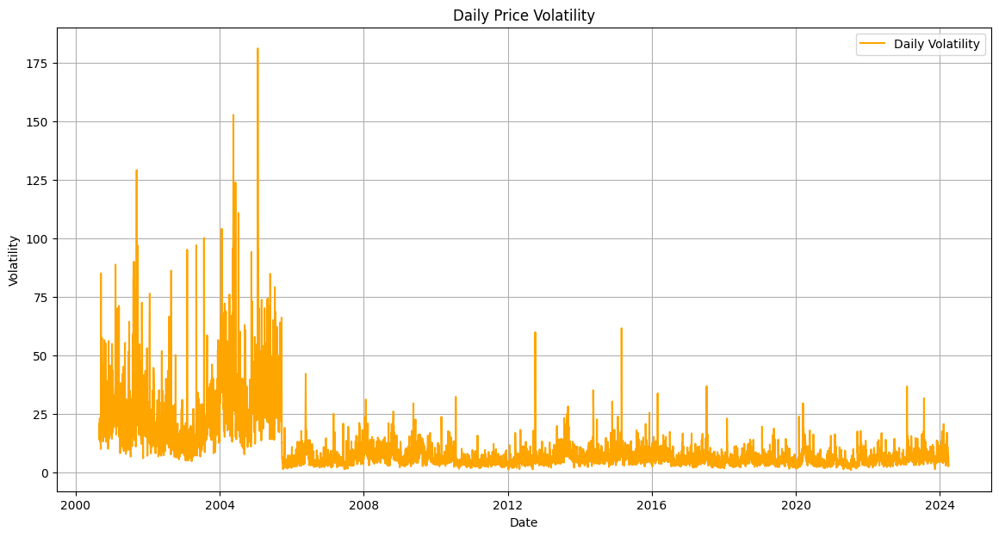

In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Calculate daily volatility as the difference between high and low prices
data['Volatility'] = data['high'] - data['low']

# Plot the daily volatility
plt.figure(figsize=(14, 7))
plt.plot(data['date'], data['Volatility'], color='orange', label='Daily Volatility')
plt.title('Daily Price Volatility')
plt.xlabel('Date')
plt.ylabel('Volatility')
plt.grid(True)
plt.legend()
plt.show()

## 2. SVM Classification

In [49]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Creating a target variable 'Up' where 1 means the next day's close is higher than today's close, otherwise 0
data['Up'] = np.where(data['close'].shift(-1) > data['close'], 1, 0)

# Features for classification
X = data[['open', 'high', 'low', 'close', 'volume', 'Volatility']]
y = data['Up']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data (SVM is sensitive to feature scales)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

2.2 Implementing and Comparing Classifiers

a. Support Vector Machine (SVM)

In [50]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# SVM Model
svm_model = SVC(kernel='linear', random_state=42)
svm_model.fit(X_train, y_train)

# Predictions
y_pred_svm = svm_model.predict(X_test)

# Evaluation
accuracy_svm = accuracy_score(y_test, y_pred_svm)
print(f'SVM Classification Accuracy: {accuracy_svm}')
print(f'SVM Classification Report:\n{classification_report(y_test, y_pred_svm)}')
print(f'SVM Confusion Matrix:\n{confusion_matrix(y_test, y_pred_svm)}')


SVM Classification Accuracy: 0.5004248088360238
SVM Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       588
           1       0.50      1.00      0.67       589

    accuracy                           0.50      1177
   macro avg       0.25      0.50      0.33      1177
weighted avg       0.25      0.50      0.33      1177

SVM Confusion Matrix:
[[  0 588]
 [  0 589]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [51]:
from sklearn.linear_model import LogisticRegression

# Logistic Regression Model
lr_model = LogisticRegression(random_state=42)
lr_model.fit(X_train, y_train)

# Predictions
y_pred_lr = lr_model.predict(X_test)

# Evaluation
accuracy_lr = accuracy_score(y_test, y_pred_lr)
print(f'Logistic Regression Accuracy: {accuracy_lr}')
print(f'Logistic Regression Classification Report:\n{classification_report(y_test, y_pred_lr)}')
print(f'Logistic Regression Confusion Matrix:\n{confusion_matrix(y_test, y_pred_lr)}')


Logistic Regression Accuracy: 0.5038232795242141
Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.17      0.25       588
           1       0.50      0.84      0.63       589

    accuracy                           0.50      1177
   macro avg       0.51      0.50      0.44      1177
weighted avg       0.51      0.50      0.44      1177

Logistic Regression Confusion Matrix:
[[ 99 489]
 [ 95 494]]


In [52]:
from sklearn.ensemble import RandomForestClassifier

# Random Forest Model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluation
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f'Random Forest Classification Accuracy: {accuracy_rf}')
print(f'Random Forest Classification Report:\n{classification_report(y_test, y_pred_rf)}')
print(f'Random Forest Confusion Matrix:\n{confusion_matrix(y_test, y_pred_rf)}')

Random Forest Classification Accuracy: 0.514018691588785
Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.51      0.51       588
           1       0.51      0.51      0.51       589

    accuracy                           0.51      1177
   macro avg       0.51      0.51      0.51      1177
weighted avg       0.51      0.51      0.51      1177

Random Forest Confusion Matrix:
[[302 286]
 [286 303]]


## Daily Fluctuation Analysis

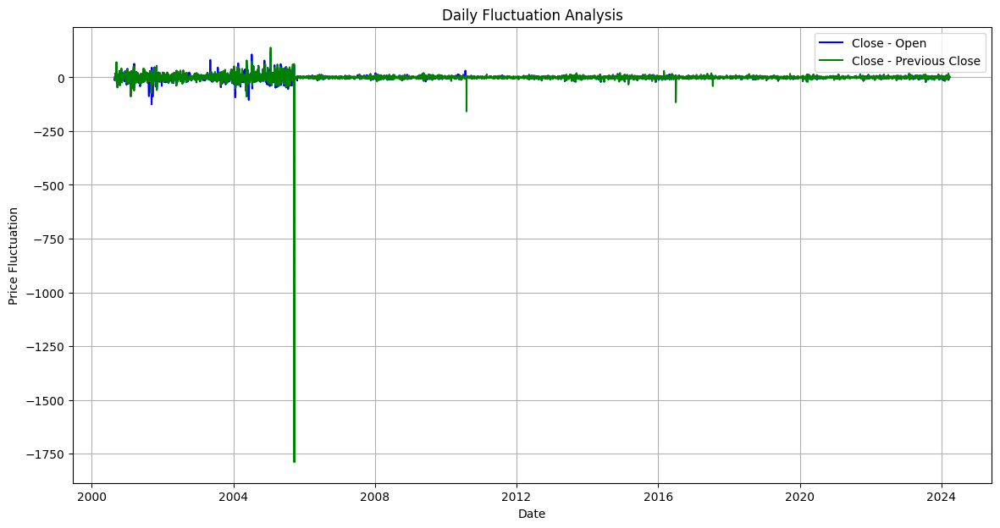

In [53]:
# Calculate daily fluctuations
data['Daily_Fluctuation'] = data['close'] - data['open']
data['Prev_Close_Fluctuation'] = data['close'] - data['prev._close']

# Plot the daily fluctuations
plt.figure(figsize=(14, 7))
plt.plot(data['date'], data['Daily_Fluctuation'], label='Close - Open', color='blue')
plt.plot(data['date'], data['Prev_Close_Fluctuation'], label='Close - Previous Close', color='green')
plt.title('Daily Fluctuation Analysis')
plt.xlabel('Date')
plt.ylabel('Price Fluctuation')
plt.legend()
plt.grid(True)
plt.show()

In [54]:
# Print out the accuracy for all models
print("Model Performance Summary:")
print(f"SVM Classification Accuracy: {accuracy_svm}")
print(f"Logistic Regression Accuracy: {accuracy_lr}")
print(f"Random Forest Classification Accuracy: {accuracy_rf}")


Model Performance Summary:
SVM Classification Accuracy: 0.5004248088360238
Logistic Regression Accuracy: 0.5038232795242141
Random Forest Classification Accuracy: 0.514018691588785


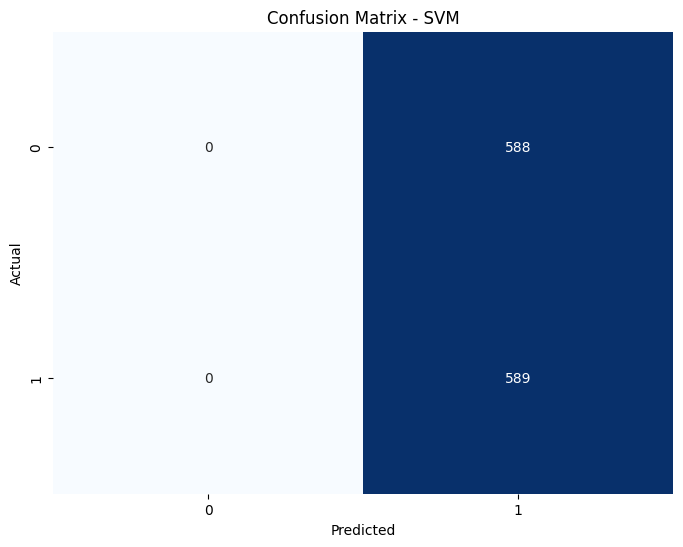

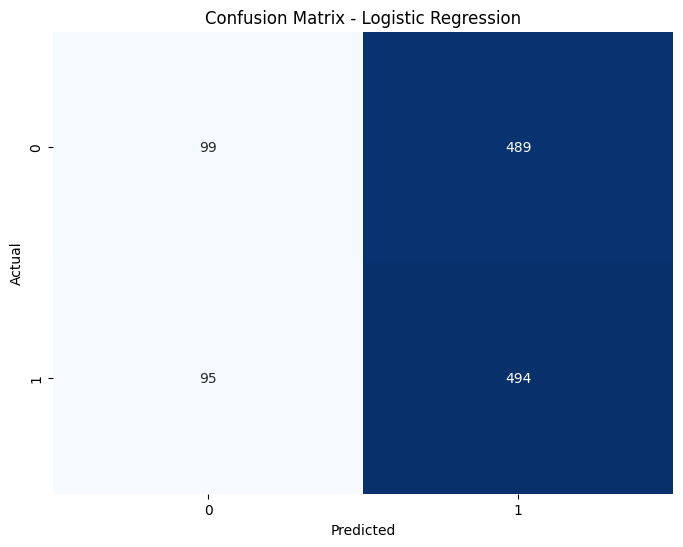

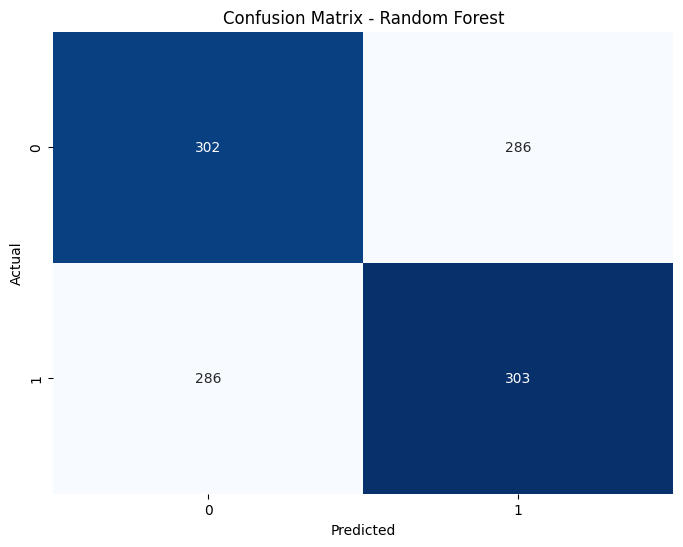

In [56]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Function to plot confusion matrix
def plot_confusion_matrix(cm, title):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Confusion Matrix - {title}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Confusion matrix for SVM
cm_svm = confusion_matrix(y_test, y_pred_svm)
plot_confusion_matrix(cm_svm, 'SVM')

# Confusion matrix for Logistic Regression
cm_lr = confusion_matrix(y_test, y_pred_lr)
plot_confusion_matrix(cm_lr, 'Logistic Regression')

# Confusion matrix for Random Forest
cm_rf = confusion_matrix(y_test, y_pred_rf)
plot_confusion_matrix(cm_rf, 'Random Forest')

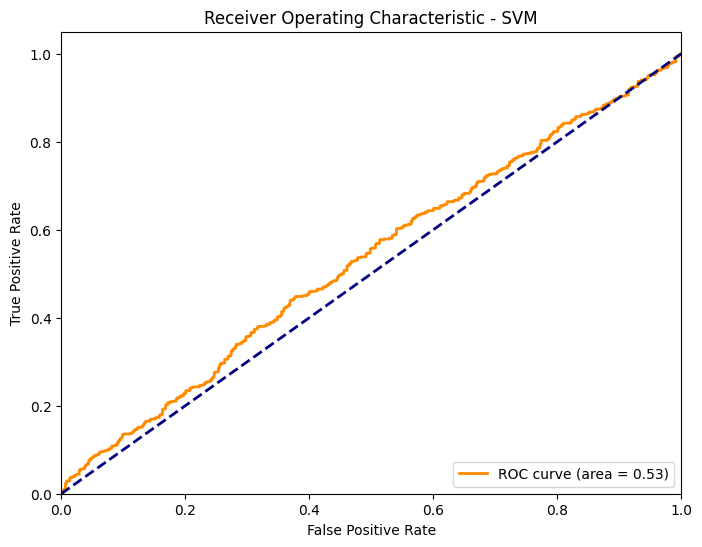

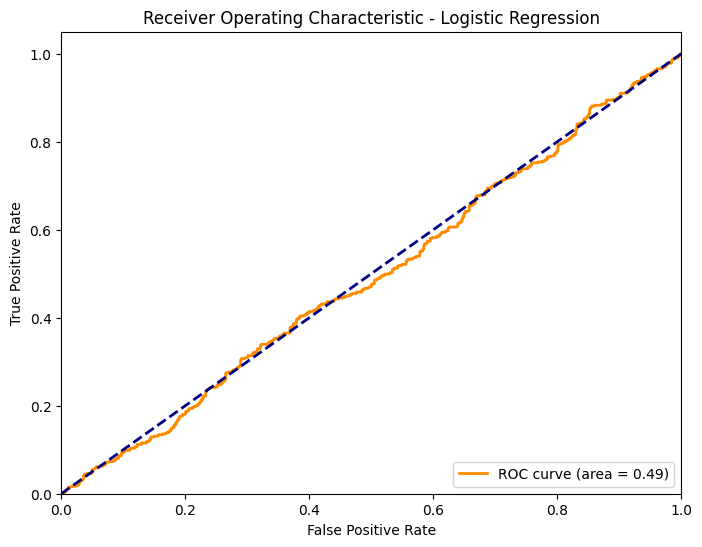

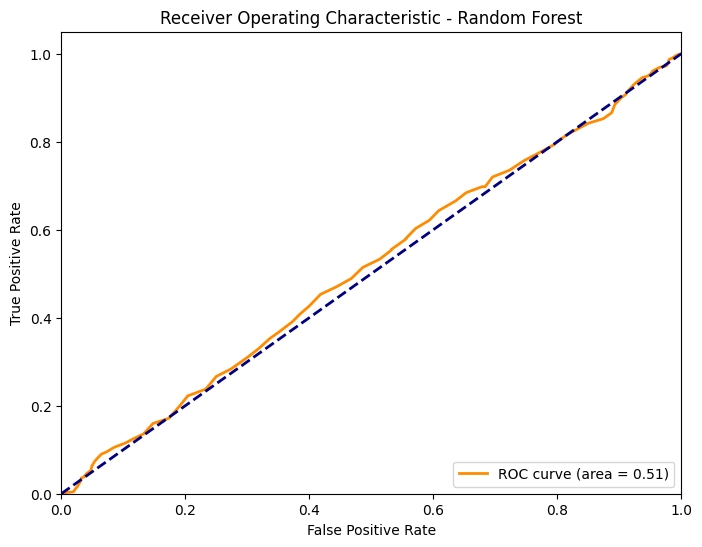

In [57]:
from sklearn.metrics import roc_curve, auc

# Function to plot ROC curve
def plot_roc_curve(y_test, y_pred_proba, title):
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic - {title}')
    plt.legend(loc="lower right")
    plt.show()

# Plot ROC curve for SVM (using decision_function to get probability scores)
y_pred_svm_proba = svm_model.decision_function(X_test)
plot_roc_curve(y_test, y_pred_svm_proba, 'SVM')

# Plot ROC curve for Logistic Regression
y_pred_lr_proba = lr_model.predict_proba(X_test)[:, 1]
plot_roc_curve(y_test, y_pred_lr_proba, 'Logistic Regression')

# Plot ROC curve for Random Forest
y_pred_rf_proba = rf_model.predict_proba(X_test)[:, 1]
plot_roc_curve(y_test, y_pred_rf_proba, 'Random Forest')

#1. Volume-Value Relationship

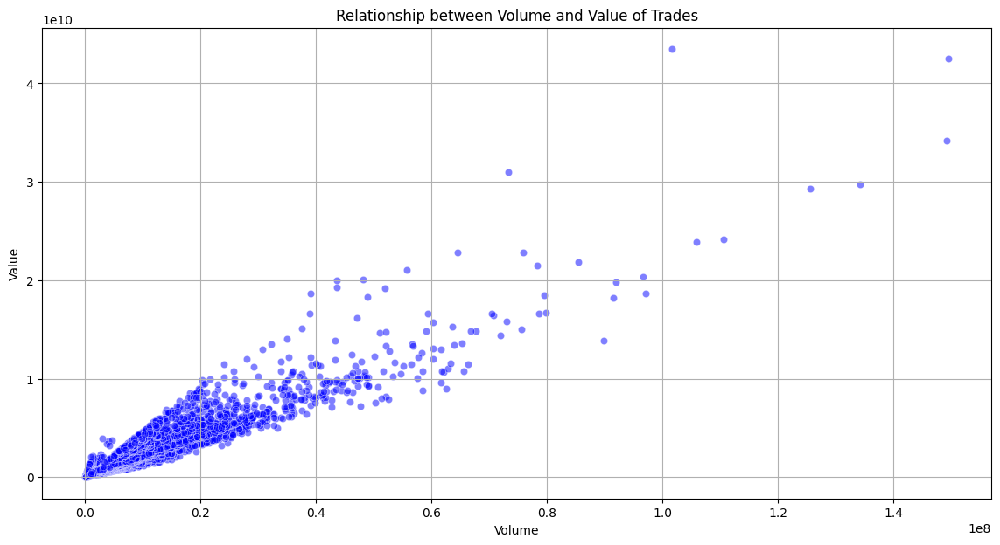

Correlation between Volume and Value: 0.94


In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

# Scatter plot to visualize the relationship between volume and value
plt.figure(figsize=(14, 7))
sns.scatterplot(x='volume', y='value', data=data, alpha=0.5, color='blue')
plt.title('Relationship between Volume and Value of Trades')
plt.xlabel('Volume')
plt.ylabel('Value')
plt.grid(True)
plt.show()

# Correlation between volume and value
correlation = data['volume'].corr(data['value'])
print(f'Correlation between Volume and Value: {correlation:.2f}')


# 2. Decision Trees for Significant Factors

In [71]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Step 2: Prepare Data for Classification
# Creating a binary target where 1 indicates the stock price will go up the next day, 0 otherwise
data['Up'] = np.where(data['close'].shift(-1) > data['close'], 1, 0)

# Features for classification
X_class = data[['open', 'high', 'low', 'close', 'volume', 'value', 'no_of_trades']]
y_class = data['Up']

# Train-test split
X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(X_class, y_class, test_size=0.2, random_state=42)

# Step 3: Implement and Compare Classification Models

# a. Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train_class, y_train_class)
y_pred_tree_class = dt_classifier.predict(X_test_class)
cm_tree = confusion_matrix(y_test_class, y_pred_tree_class)
print(f"Decision Tree Accuracy: {accuracy_score(y_test_class, y_pred_tree_class)}")
print(f"Decision Tree Classification Report:\n{classification_report(y_test_class, y_pred_tree_class)}")

Decision Tree Accuracy: 0.5191163976210705
Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.51      0.52       588
           1       0.52      0.53      0.52       589

    accuracy                           0.52      1177
   macro avg       0.52      0.52      0.52      1177
weighted avg       0.52      0.52      0.52      1177



In [72]:
from sklearn.ensemble import RandomForestRegressor

# b. Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train_class, y_train_class)
y_pred_rf_class = rf_classifier.predict(X_test_class)
cm_rf = confusion_matrix(y_test_class, y_pred_rf_class)
print(f"Random Forest Accuracy: {accuracy_score(y_test_class, y_pred_rf_class)}")
print(f"Random Forest Classification Report:\n{classification_report(y_test_class, y_pred_rf_class)}")

Random Forest Accuracy: 0.5097706032285472
Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.53      0.52       588
           1       0.51      0.49      0.50       589

    accuracy                           0.51      1177
   macro avg       0.51      0.51      0.51      1177
weighted avg       0.51      0.51      0.51      1177



In [73]:
from sklearn.linear_model import LinearRegression

# c. Logistic Regression Classifier
lr_classifier = LogisticRegression(random_state=42)
lr_classifier.fit(X_train_class, y_train_class)
y_pred_lr_class = lr_classifier.predict(X_test_class)
cm_lr = confusion_matrix(y_test_class, y_pred_lr_class)
print(f"Logistic Regression Accuracy: {accuracy_score(y_test_class, y_pred_lr_class)}")
print(f"Logistic Regression Classification Report:\n{classification_report(y_test_class, y_pred_lr_class)}")



Logistic Regression Accuracy: 0.5004248088360238
Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       588
           1       0.50      1.00      0.67       589

    accuracy                           0.50      1177
   macro avg       0.25      0.50      0.33      1177
weighted avg       0.25      0.50      0.33      1177



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


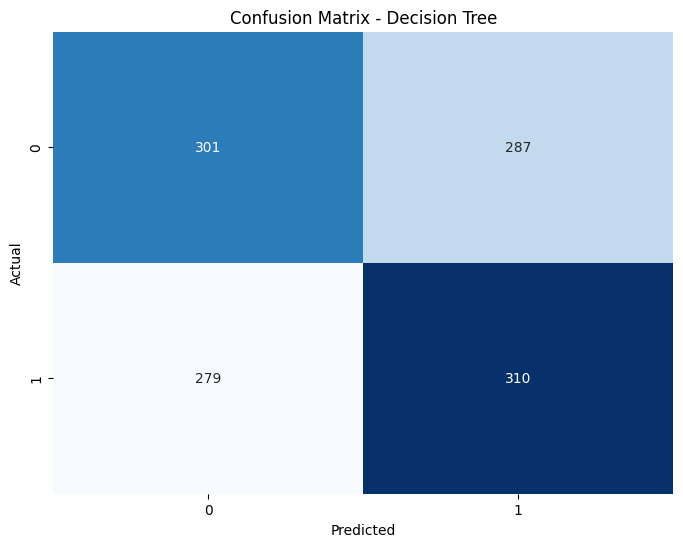

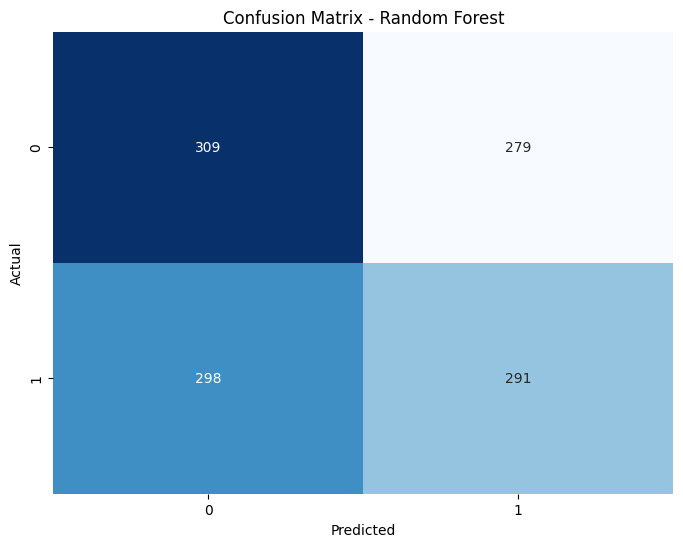

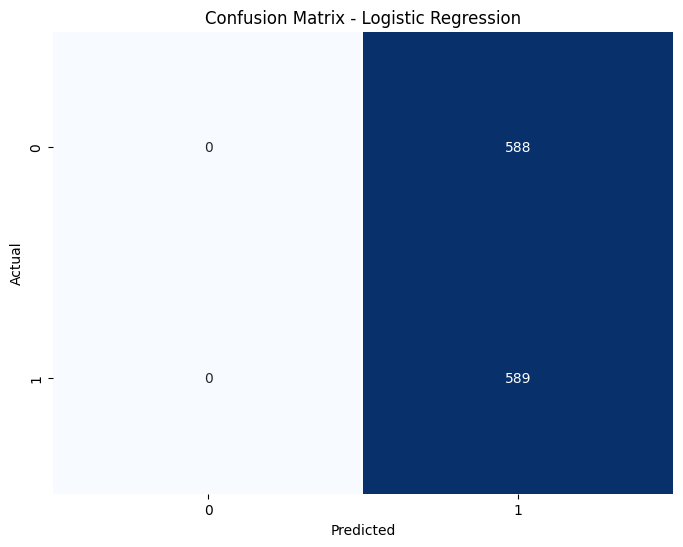

In [74]:
def plot_confusion_matrix(cm, title):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Confusion Matrix - {title}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Confusion Matrices for all models
plot_confusion_matrix(cm_tree, 'Decision Tree')
plot_confusion_matrix(cm_rf, 'Random Forest')
plot_confusion_matrix(cm_lr, 'Logistic Regression')

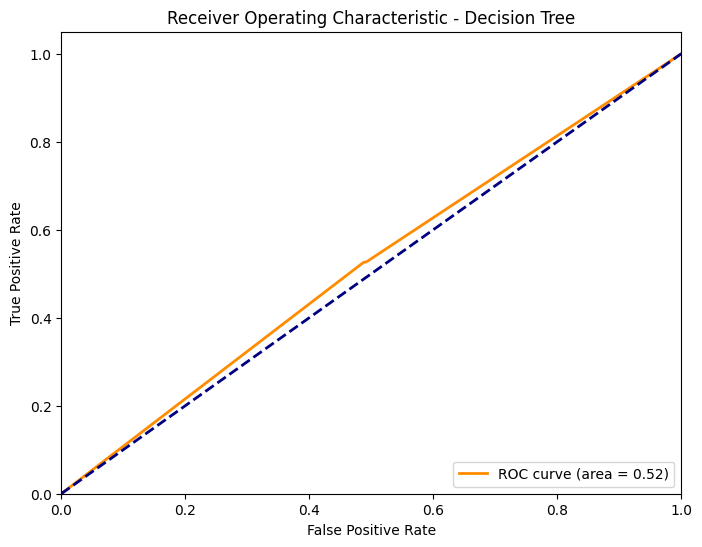

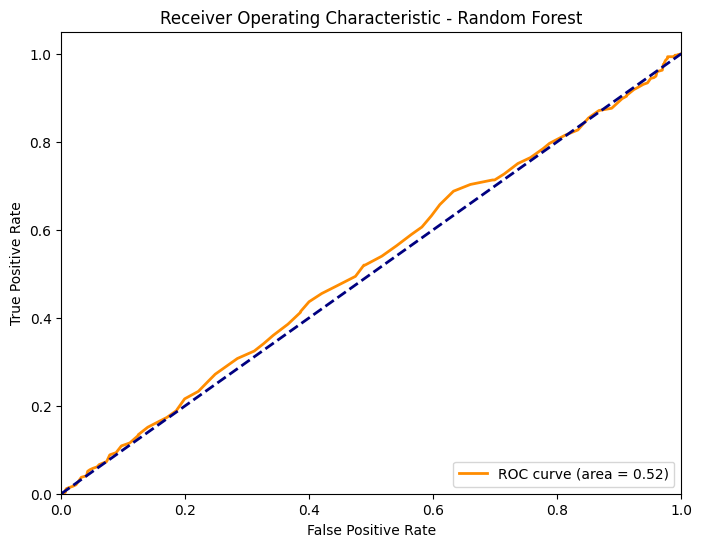

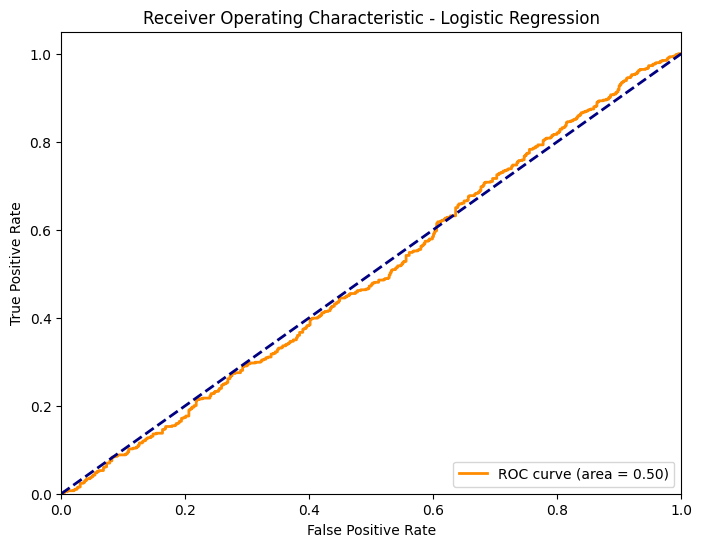

In [75]:
# Step 5: Visualization of AUC-ROC Curve

def plot_roc_curve(y_test, y_pred_proba, title):
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic - {title}')
    plt.legend(loc="lower right")
    plt.show()

# ROC Curves for all models
y_pred_tree_proba = dt_classifier.predict_proba(X_test_class)[:, 1]
plot_roc_curve(y_test_class, y_pred_tree_proba, 'Decision Tree')

y_pred_rf_proba = rf_classifier.predict_proba(X_test_class)[:, 1]
plot_roc_curve(y_test_class, y_pred_rf_proba, 'Random Forest')

y_pred_lr_proba = lr_classifier.predict_proba(X_test_class)[:, 1]
plot_roc_curve(y_test_class, y_pred_lr_proba, 'Logistic Regression')


# 3. Liquidity Assessment

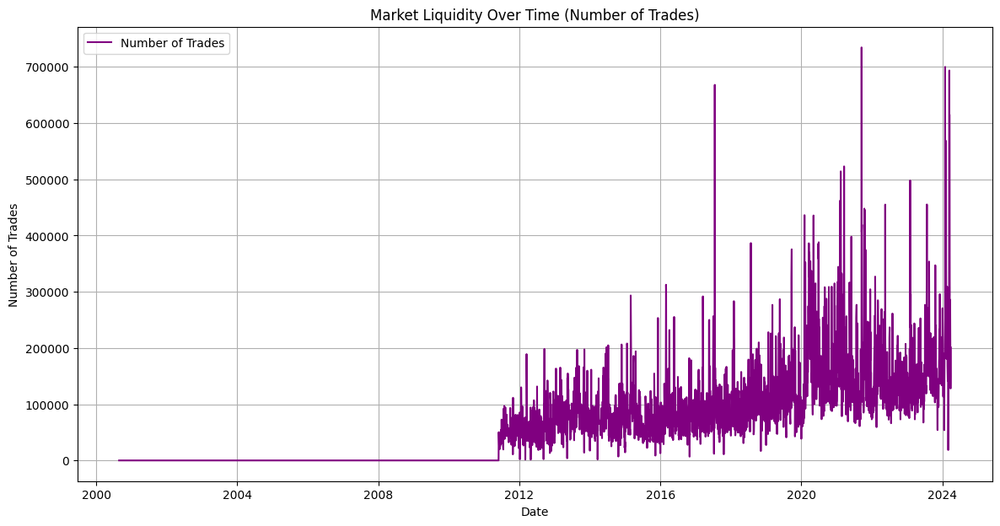

In [64]:
# Plotting the number of trades to assess liquidity over time
plt.figure(figsize=(14, 7))
plt.plot(data['date'], data['no_of_trades'], label='Number of Trades', color='purple')
plt.title('Market Liquidity Over Time (Number of Trades)')
plt.xlabel('Date')
plt.ylabel('Number of Trades')
plt.grid(True)
plt.legend()
plt.show()

1. VWAP Calculation

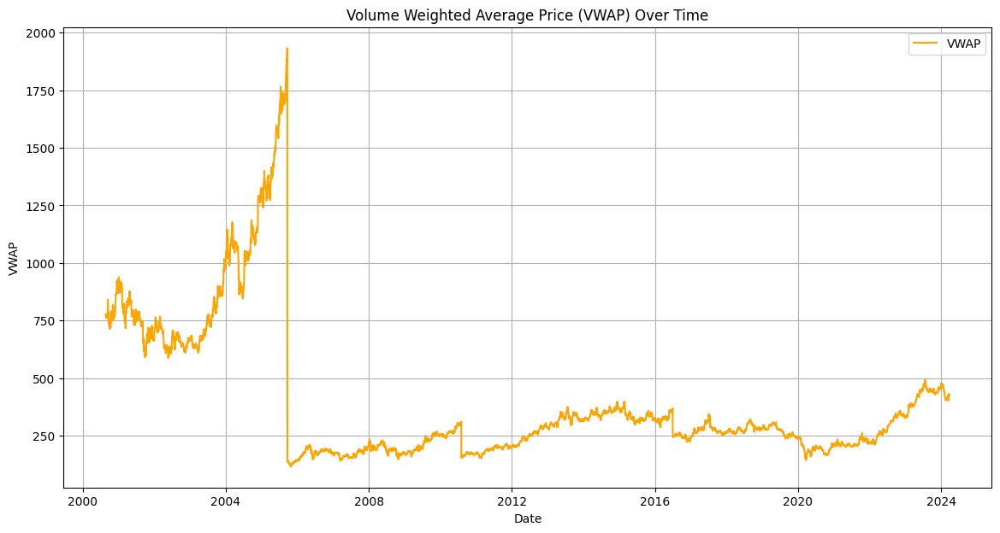

In [76]:
# Assuming 'data' is your DataFrame and includes 'volume', 'close', and 'vwap'

# VWAP is already calculated in your dataset, but here is how you can calculate it manually:
data['VWAP'] = (data['value']) / data['volume']

# Plotting the VWAP over time
plt.figure(figsize=(14, 7))
plt.plot(data['date'], data['VWAP'], label='VWAP', color='orange')
plt.title('Volume Weighted Average Price (VWAP) Over Time')
plt.xlabel('Date')
plt.ylabel('VWAP')
plt.grid(True)
plt.legend()
plt.show()

# 2. Neural Networks for VWAP Prediction

In [77]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Features and target for VWAP prediction
X_vwap = data[['open', 'high', 'low', 'close', 'volume']]
y_vwap = data['VWAP']

# Train-test split
X_train_vwap, X_test_vwap, y_train_vwap, y_test_vwap = train_test_split(X_vwap, y_vwap, test_size=0.2, random_state=42)

# Feature scaling (especially important for neural networks)
scaler = StandardScaler()
X_train_vwap = scaler.fit_transform(X_train_vwap)
X_test_vwap = scaler.transform(X_test_vwap)

In [78]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Define the neural network model
nn_model = Sequential()
nn_model.add(Dense(64, input_dim=X_train_vwap.shape[1], activation='relu'))
nn_model.add(Dense(32, activation='relu'))
nn_model.add(Dense(1))  # Output layer for regression

# Compile the model
nn_model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
nn_model.fit(X_train_vwap, y_train_vwap, epochs=50, batch_size=32, verbose=1)

# Predictions
y_pred_nn = nn_model.predict(X_test_vwap)

# Evaluation
mse_nn = mean_squared_error(y_test_vwap, y_pred_nn)
print(f'Neural Network - Mean Squared Error: {mse_nn}')


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
148/148 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 245274.2656
Epoch 2/50
148/148 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 186566.0938
Epoch 3/50
148/148 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 53455.4023
Epoch 4/50
148/148 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 13196.3262
Epoch 5/50
148/148 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 8695.0742
Epoch 6/50
148/148 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 5477.7227
Epoch 7/50
148/148 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2716.8635
Epoch 8/50
148/148 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1596.2791
Epoch 9/50
148/148 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1040.8328
Epoch 10/50
148/148 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 763.0446 
Epoch 11/50
148/148 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 523.2460
Epoch 12/50
148/148 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 392.6768
Epoch 13/50
148/148 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 304.9363
Epoch 14/50
148/148 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 215.7382
Epoch 15/50
1

In [79]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Linear Regression Model
lr_model = LinearRegression()
lr_model.fit(X_train_vwap, y_train_vwap)

# Predictions
y_pred_lr = lr_model.predict(X_test_vwap)

# Evaluation
mse_lr = mean_squared_error(y_test_vwap, y_pred_lr)
r2_lr = r2_score(y_test_vwap, y_pred_lr)

print(f'Linear Regression - Mean Squared Error: {mse_lr}')
print(f'Linear Regression - R-squared: {r2_lr}')

Linear Regression - Mean Squared Error: 2.929960026964433
Linear Regression - R-squared: 0.9999712571190338


In [80]:
from sklearn.ensemble import RandomForestRegressor

# Random Forest Model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train_vwap, y_train_vwap)

# Predictions
y_pred_rf = rf_model.predict(X_test_vwap)

# Evaluation
mse_rf = mean_squared_error(y_test_vwap, y_pred_rf)
r2_rf = r2_score(y_test_vwap, y_pred_rf)

print(f'Random Forest - Mean Squared Error: {mse_rf}')
print(f'Random Forest - R-squared: {r2_rf}')


Random Forest - Mean Squared Error: 6.485511809957353
Random Forest - R-squared: 0.9999363771886842


184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:458: UserWarning: X has feature names, but LinearRegression was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:458: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


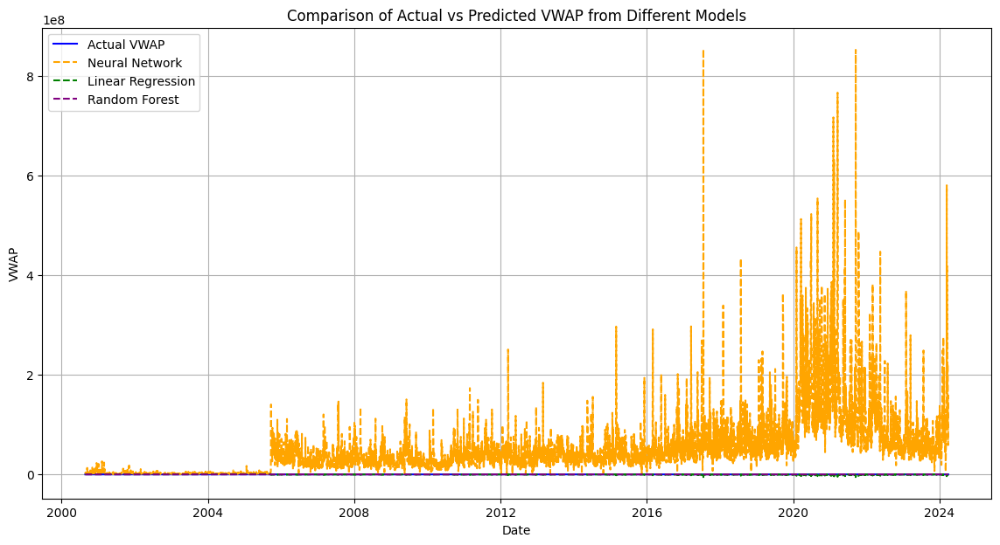

In [81]:
# Add predictions to the DataFrame for visualization
data['Predicted_VWAP_NN'] = nn_model.predict(X_vwap)
data['Predicted_VWAP_LR'] = lr_model.predict(X_vwap)
data['Predicted_VWAP_RF'] = rf_model.predict(X_vwap)

# Visualization of Actual vs Predicted VWAP from all models
plt.figure(figsize=(14, 7))
plt.plot(data['date'], data['VWAP'], label='Actual VWAP', color='blue')
plt.plot(data['date'], data['Predicted_VWAP_NN'], label='Neural Network', color='orange', linestyle='--')
plt.plot(data['date'], data['Predicted_VWAP_LR'], label='Linear Regression', color='green', linestyle='--')
plt.plot(data['date'], data['Predicted_VWAP_RF'], label='Random Forest', color='purple', linestyle='--')
plt.title('Comparison of Actual vs Predicted VWAP from Different Models')
plt.xlabel('Date')
plt.ylabel('VWAP')
plt.legend()
plt.grid(True)
plt.show()

In [82]:
# Print out the MSE and R-squared for all models
print("Model Performance Summary:")
print(f"Neural Network - MSE: {mse_nn}")
print(f"Linear Regression - MSE: {mse_lr}, R2: {r2_lr}")
print(f"Random Forest - MSE: {mse_rf}, R2: {r2_rf}")


Model Performance Summary:
Neural Network - MSE: 5.579614117622709
Linear Regression - MSE: 2.929960026964433, R2: 0.9999712571190338
Random Forest - MSE: 6.485511809957353, R2: 0.9999363771886842
